# **<div align=center>Влияние гормональной терапии<br>дексаметазоном и преднизолоном<br>на гемодинамический статус у детей с тяжелой политравмой.</div>**
### <div align=right>**Пшениснов Константин Викторович / Pshenisnov Konstantin Victorovich**<br>кандидат медицинских наук, врач анестезиолог-реаниматолог,<br>Кафедра анестезиологии, реаниматологии и неотложной педиатрии ФП и ДПО<br>Санкт-Петербургского Государственного Педиатрического Медицинского Университета,<br>г.Санкт-Петербург<br><br>**Липин Андрей Сергеевич / Lipin Andrei Sergeevich**<br>врач анестезиолог-реаниматолог, аналитик данных, г. Санкт-Петербург</div>

In [1]:
import pandas as pd
import numpy as np
from scipy import stats
from matplotlib import pyplot as plt
import seaborn as sns

sns.set(style='whitegrid', rc={"grid.linewidth": 0.1})
sns.set_context("paper", font_scale=1.8)

### В данном исследовании разбираются вопросы связи гормональной терапии (преднизолом и дексаметазоном) и клинико-лабораторных (гемодинамических и биохимических) изменений у пациентов до 18 лет с тяжелой сочетанной травмой.

* Обозначения:
    * ГТ = гормональная терапия
    * ГТ+ - получение гормональной терапии
    * ГТ- - гормональная терапия не использовалась

**Исследуемые параметры**:
* систолическое артериальное давление (САД);
* диастолическое артериальное давление (ДАД);
* среднее артериальное давление (СрАД);
* частота сердечных сокращений;
* индекс Альговера;
* насыщение крови кислородом (SpO2);
* масса тела;
* хлор в крови;
* лактат в крови;
* АЛТ в крови;
* АСТ в крови;
* АЧТВ
* инфузия (в процентах от физиологической потребности);
* катехоламиновый индекс;
* площадь тела;
* диурез;
* исход заболевания.

### Загрузка данных и описательная статистика всей выборки

In [2]:
# чтение данных
df_plot = df = pd.read_csv('../Datasets/improved_08_2020.csv',index_col=0)
# выбор параметров
target_columns = ['AGE','GT','SBP','DBP','MBP','HR','IA','SpO2','Weight','Cl-','LACT','AMYL','ALT','AST','APTV','VOL_%','CI','B_surface','Diur_p_kg', 'OUTCOME']
df = df[['ID','Day'] + target_columns]
# переименование
df.columns = target_columns = ['ID','Day','Возраст','GT','САД', 'ДАД','СрАД','ЧСС','ИА','SpO2','Масса тела','Cl-','Лактат','Амилаза','АЛТ','АСТ','АЧТВ','Инфузия, % от N','КИ','Площадь тела','Диурез, мл/кг', 'OUTCOME']
# описательная статистика
df[2:].describe().T

,count,mean,std,min,25%,50%,75%,max
ID,1390.0,89.139568,53.483134,1.000000,56.000000,84.000000,119.000000,216.000000
Day,1390.0,7.479137,7.851433,1.000000,2.000000,5.000000,9.000000,49.000000
Возраст,1390.0,9.973351,5.452043,0.250000,5.000000,11.000000,15.000000,18.000000
GT,1390.0,0.323022,0.467799,0.000000,0.000000,0.000000,1.000000,1.000000
САД,1390.0,111.279856,15.730912,45.000000,100.000000,110.000000,120.000000,170.000000
ДАД,1390.0,64.853237,12.544982,5.000000,58.000000,65.000000,73.000000,119.000000
СрАД,1390.0,80.328777,12.699138,26.333333,73.333333,80.166667,88.333333,120.666667
ЧСС,1390.0,105.741727,23.503876,24.000000,90.000000,106.000000,120.000000,186.000000
ИА,1390.0,0.975362,0.294496,0.200000,0.781818,0.946333,1.105263,3.100000
SpO2,1390.0,98.374820,3.334239,26.000000,98.000000,99.000000,100.000000,110.000000


* Количество пациентов

In [3]:
df.ID.nunique()

203

В данном исследовании пациенты отбирались по следующим критериям:

    * наличие сочетанной травмы;
    * отсутствие сопутствующих заболеваний;
    * возраст до 18 лет;
    * необходимость лечения в отделении реанимации и интенсивной терапии.

На графиках бокс-плот видно, что выжившие и умершие пациенты, мальчики и девочки, имеют сходные массу тела и возраст.

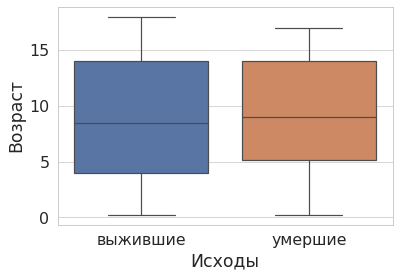

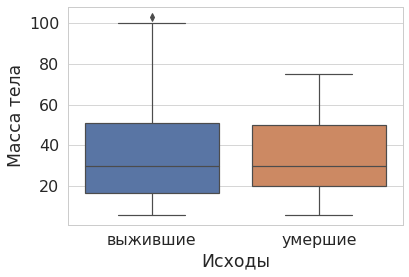

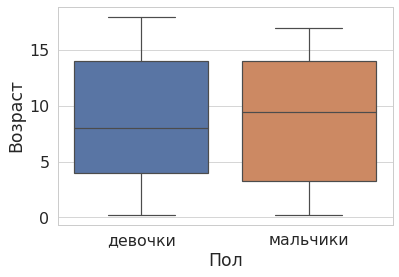

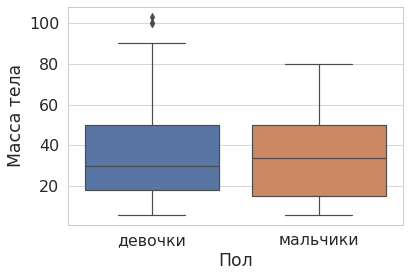

In [4]:
df_plot = df_plot[['ID','AGE','SEX','OUTCOME','Weight','Day']].groupby('ID',as_index=False).max()
sns.boxplot(x=df_plot['OUTCOME'].replace({'Died':'умершие','Survived':'выжившие'}),y = df_plot['AGE'])
plt.ylabel('Возраст')
plt.xlabel('Исходы')
plt.show()
sns.boxplot(x=df_plot['OUTCOME'].replace({'Died':'умершие','Survived':'выжившие'}),y = df_plot['Weight'])
plt.ylabel('Масса тела')
plt.xlabel('Исходы')
plt.show()
sns.boxplot(x=df_plot['SEX'].replace({0:'девочки',1:'мальчики'}),y = df_plot['AGE'])
plt.ylabel('Возраст')
plt.xlabel('Пол')
plt.show()
sns.boxplot(x=df_plot['SEX'].replace({0:'девочки',1:'мальчики'}),y = df_plot['Weight'])
plt.ylabel('Масса тела')
plt.xlabel('Пол')
plt.show()

---

## Анализ различий между параметрами в разные дни

**Первый день в ОРИТ:<br>значения клинико-лабораторных данных при поступлении (т.е. в первый день) могут сильно отличаться от средних значений соответствующих параметров каждого пациента в другие дни из-за проводимой терапии**.<br>
**Проведенный ниже тест Вилкоксона показывает, что имеется существенная разница между параметрами в 1й день и средними значениями за последующие дни**

- **средние** значения каждого пациента за первые 10 дней лечения (пациенты, выписанные или умершие раньше в вборку не включены): первые 5 строк выборки

* 1 день и 2-10 дни

In [5]:
from scipy.stats import wilcoxon
df0_ = df.loc[(df.Day>1)&(df.Day<=10),:].groupby('ID',as_index=False).mean().drop('Day',axis=1)
df1_ = df.loc[df.Day==1,:].drop('Day',axis=1)
ids = df0_.ID.unique() # смотрим только пациентов, которые оставались в ОРИТ в период 2-10 день
columns = list(df0_.columns[2:-1])
columns.remove('Масса тела')
columns.remove('Площадь тела')
results = []
for i in columns:
    statistics, p = stats.wilcoxon(df0_[i],df1_[df1_.ID.isin(ids)][i])
    results.append([i,round(p,3),f'Различие значимо' if p<0.05 else f'Не значимое различие'])
pd.DataFrame(results)

,0,1,2
0,GT,0.001,Различие значимо
1,САД,0.005,Различие значимо
2,ДАД,0.019,Различие значимо
3,СрАД,0.008,Различие значимо
4,ЧСС,0.000,Различие значимо
5,ИА,0.000,Различие значимо
6,SpO2,0.685,Не значимое различие
7,Cl-,0.023,Различие значимо
8,Лактат,0.001,Различие значимо
9,Амилаза,0.000,Различие значимо


* Эти результаты пригодятся позже

* Для сравнения: подобный анализ сделан для 2го дня и средних значений за последующие дни;
* То же самое - для 3го дня.
* В результате можно видеть, что уже к 3му дню различия значительно менее выражены

* 2 день и 3-10 дни

In [6]:
# 2 день и 3-10 дни
df0_ = df.loc[(df.Day!=1)&(df.Day!=2)&(df.Day<=10),:].groupby('ID',as_index=False).mean().drop('Day',axis=1)
df1_ = df.loc[df.Day==2,:].drop('Day',axis=1)
ids = df0_.ID.unique() # смотрим только пациентов, которые оставались в ОРИТ в период 3-10 день
columns = list(df0_.columns[2:-1])
columns.remove('Масса тела')
columns.remove('Площадь тела')
results = []
for i in columns:
    statistics, p = stats.wilcoxon(df0_[i],df1_[df1_.ID.isin(ids)][i])
    results.append([i,round(p,3),f'Различие значимо' if p<0.05 else f'Не значимое различие'])
print("Различия между значениями параметров на 2й день и средними значениями за последующие дни (до 10го дня)")
pd.DataFrame(results)

Различия между значениями параметров на 2й день и средними значениями за последующие дни (до 10го дня)


,0,1,2
0,GT,0.002,Различие значимо
1,САД,0.001,Различие значимо
2,ДАД,0.001,Различие значимо
3,СрАД,0.000,Различие значимо
4,ЧСС,0.000,Различие значимо
5,ИА,0.000,Различие значимо
6,SpO2,0.012,Различие значимо
7,Cl-,0.012,Различие значимо
8,Лактат,0.072,Не значимое различие
9,Амилаза,0.278,Не значимое различие


* 3 день и 4-10 дни

In [7]:
# в выборку за третий день не попал пациент №17 с неполностью заполненными полями
df[df.ID==17]

,ID,Day,Возраст,GT,САД,ДАД,СрАД,ЧСС,ИА,SpO2,...,Лактат,Амилаза,АЛТ,АСТ,АЧТВ,"Инфузия, % от N",КИ,Площадь тела,"Диурез, мл/кг",OUTCOME
91,17,1,4.0,1.0,100.0,65.0,76.666667,128.0,1.28000,98.0,...,0.0,49.7,15.8,35.9,30.6,79.261364,0.0,0.61,62.5,Survived
92,17,2,4.0,0.0,107.0,54.0,71.666667,119.0,1.11215,100.0,...,0.0,49.7,37.8,67.1,30.6,161.931818,0.0,0.61,43.5,Survived
93,17,4,4.0,0.0,107.0,54.0,71.666667,119.0,1.11215,98.0,...,0.0,49.7,59.8,98.3,30.6,17.045455,0.0,0.61,5.0,Survived


In [8]:
# 3 день и 4-10 дни
df0_ = df.loc[(~df.Day.isin([1,2,3]))&(df.Day<=10),:].groupby('ID',as_index=False).mean().drop('Day',axis=1)
df1_ = df.loc[df.Day==3,:].drop('Day',axis=1)
ids = df0_.ID.unique() # смотрим только пациентов, которые оставались в ОРИТ в период 4-10 день
ids = ids[~np.isin(ids,17)]
columns = list(df0_.columns[2:-1])
columns.remove('Масса тела')
columns.remove('Площадь тела')
results = []
for i in columns:
    statistics, p = stats.wilcoxon(df0_[df0_.ID.isin(ids)][i],df1_[df1_.ID.isin(ids)][i])
    results.append([i,round(p,3),f'Различие значимо' if p<0.05 else f'Не значимое различие'])
print("Различия между значениями параметров на 3й день и средними значениями за последующие дни (до 10го дня)")
pd.DataFrame(results)

Различия между значениями параметров на 3й день и средними значениями за последующие дни (до 10го дня)


,0,1,2
0,GT,0.000,Различие значимо
1,САД,0.011,Различие значимо
2,ДАД,0.310,Не значимое различие
3,СрАД,0.066,Не значимое различие
4,ЧСС,0.670,Не значимое различие
5,ИА,0.181,Не значимое различие
6,SpO2,0.233,Не значимое различие
7,Cl-,0.000,Различие значимо
8,Лактат,0.511,Не значимое различие
9,Амилаза,0.017,Различие значимо


---

## Анализ различий между значениями параметров разных ГТ-групп пациентов

#### На основе получения ГТ и исходов заболевания было сформировано 9 групп пациентов:
1. Общая группа (все пациенты)
2. Пациенты, получавшие ГТ
3. Пациенты, не получавшие ГТ
4. Выжившие пациенты
5. Выжившие пациенты, получавшие ГТ
6. Выжившие пациенты, не получавшие ГТ
7. Умершие пациенты
8. Умершие пациенты, получавшие ГТ
9. Умершие пациенты, не получавшие ГТ

In [9]:
days = list(range(1,8))
df_all = df.loc[df.Day==7,'ID'].unique()
df_all = df.loc[(df.ID.isin(df_all))&(df.Day.isin(days)),:]
df_gt_users = df_all.loc[df_all.GT==1,'ID'].unique()
df_gt = df_all.loc[df_all.ID.isin(df_gt_users),:]
df_nogt = df_all.loc[~df_all.ID.isin(df_gt_users),:]
df_surv = df_all.loc[df_all.OUTCOME=='Survived',:]
# df_surv_gt_users = df_all.loc[(df_all.OUTCOME=='Survived')&(df_all.GT==1),'ID'].unique()
df_surv_gt = df_gt.loc[df_gt.OUTCOME=='Survived',:]
df_surv_nogt = df_nogt.loc[df_nogt.OUTCOME=='Survived',:]
df_died = df_all.loc[df_all.OUTCOME=='Died',:]
# df_died_gt_users = df_all.loc[(df_all.OUTCOME=='Died')&(df_all.GT==1),'ID'].unique()
df_died_gt = df_gt.loc[df_gt.OUTCOME=='Died',:]
df_died_nogt = df_nogt.loc[df_nogt.OUTCOME=='Died',:]

print(f'Всего пациентов, лечившихся 7 и более дней: {df_all.ID.nunique()}\n\
всего пациентов, получавших ГТ: {df_gt.ID.nunique()}\n\
всего пациентов, не получавших ГТ: {df_nogt.ID.nunique()}\n\
выживших пациентов: {df_surv.ID.nunique()}\n\
выживших, получавших ГТ: {df_surv_gt.ID.nunique()}\n\
выживших, не получавших ГТ: {df_surv_nogt.ID.nunique()}\n\
умерших пациентов: {df_died.ID.nunique()}\n\
умерших, получавших ГТ: {df_died_gt.ID.nunique()}\n\
умерших, не получавших ГТ: {df_died_nogt.ID.nunique()}\n\
')

Всего пациентов, лечившихся 7 и более дней: 82
всего пациентов, получавших ГТ: 58
всего пациентов, не получавших ГТ: 24
выживших пациентов: 68
выживших, получавших ГТ: 47
выживших, не получавших ГТ: 21
умерших пациентов: 14
умерших, получавших ГТ: 11
умерших, не получавших ГТ: 3



### Поиск внутригрупповых различий в разные дни производили с помощью теста Фридмана
1. Изучение 1, 2, 3, 4, 5, 6, 7 дней

In [10]:
from scipy.stats import friedmanchisquare
def highlight(x):
    color = 'lightgreen' if x<=0.01 else 'lightblue'
    return 'background-color: %s' % color


params = list(set(df_all.columns[4:-1])-set(['Масса тела','Площадь тела']))
tab_lists = ['Все пациенты','Получали ГТ','Не получали ГТ', 'Выжили', 'Выжили, получали ГТ', 'Выжили, не получали ГТ', 'Умерли', 'Умерли, получали ГТ','Умерли, не получали ГТ']
results = []
for i in params:
#     print('*'*5,i,'*'*(50-len(list(i))))
    for k,z in enumerate([df_all,df_gt,df_nogt, df_surv, df_surv_gt, df_surv_nogt, df_died, df_died_gt, df_died_nogt]):
        stat,p = friedmanchisquare(z.loc[z.Day==1,i],z.loc[z.Day==2,i],z.loc[z.Day==3,i],z.loc[z.Day==4,i],z.loc[z.Day==5,i],z.loc[z.Day==6,i],z.loc[z.Day==7,i])
#         print(tab_lists[k],round(p,4))
        results.append([i,tab_lists[k],round(p,4)])

a = pd.DataFrame(results)
a = a.pivot(columns = 1,index = 0,values = 2).rename_axis(None, axis=0).rename_axis('Параметры', axis=1).style.applymap(highlight)
a

Параметры,Все пациенты,Выжили,"Выжили, не получали ГТ","Выжили, получали ГТ",Не получали ГТ,Получали ГТ,Умерли,"Умерли, не получали ГТ","Умерли, получали ГТ"
Cl-,0.000500,0.000000,0.168000,0.000200,0.453700,0.001400,0.338500,0.377600,0.723100
SpO2,0.688800,0.628200,0.832300,0.239300,0.553100,0.182100,0.125100,0.034000,0.045100
АЛТ,0.002900,0.000400,0.011700,0.073800,0.024200,0.176000,0.889300,0.757400,0.929100
АСТ,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.879500,0.821900,0.941300
АЧТВ,0.100100,0.035800,0.439300,0.083200,0.309800,0.280500,0.003500,0.098300,0.118500
Амилаза,0.000000,0.000000,0.001900,0.000000,0.001900,0.000000,0.667000,0.423200,0.423200
ДАД,0.001900,0.000200,0.442200,0.000100,0.093800,0.007800,0.808800,0.051600,0.145500
"Диурез, мл/кг",0.000900,0.003300,0.376300,0.007800,0.291800,0.001100,0.506900,0.755500,0.157300
ИА,0.000100,0.000100,0.801500,0.000000,0.759700,0.000000,0.655800,0.715300,0.501000
"Инфузия, % от N",0.000000,0.000000,0.093000,0.000100,0.111700,0.000100,0.868800,0.919700,0.727700


2. Изучение 2, 3, 4, 5, 6, 7 дней

In [11]:
def highlight(x):
    color = 'lightgreen' if x<=0.01 else 'lightblue'
    return 'background-color: %s' % color


params = list(set(df_all.columns[4:-1])-set(['Масса тела','Площадь тела']))
tab_lists = ['Все пациенты','Получали ГТ','Не получали ГТ', 'Выжили', 'Выжили, получали ГТ', 'Выжили, не получали ГТ', 'Умерли', 'Умерли, получали ГТ','Умерли, не получали ГТ']
results = []
for i in params:
#     print('*'*5,i,'*'*(50-len(list(i))))
    for k,z in enumerate([df_all,df_gt,df_nogt, df_surv, df_surv_gt, df_surv_nogt, df_died, df_died_gt, df_died_nogt]):
        stat,p = friedmanchisquare(z.loc[z.Day==2,i],z.loc[z.Day==3,i],z.loc[z.Day==4,i],z.loc[z.Day==5,i],z.loc[z.Day==6,i],z.loc[z.Day==7,i])
#         print(tab_lists[k],round(p,4))
        results.append([i,tab_lists[k],round(p,4)])

a = pd.DataFrame(results)
a = a.pivot(columns = 1,index = 0,values = 2).rename_axis(None, axis=0).rename_axis('Параметры', axis=1).style.applymap(highlight)
a

Параметры,Все пациенты,Выжили,"Выжили, не получали ГТ","Выжили, получали ГТ",Не получали ГТ,Получали ГТ,Умерли,"Умерли, не получали ГТ","Умерли, получали ГТ"
Cl-,0.000300,0.000000,0.124400,0.000100,0.285600,0.001000,0.890300,0.897700,0.840200
SpO2,0.530800,0.468800,0.633500,0.123900,0.579800,0.115200,0.043800,0.152000,0.018200
АЛТ,0.002700,0.000200,0.004200,0.062000,0.026000,0.116000,0.908600,0.971000,0.893100
АСТ,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.847400,0.784800,0.870500
АЧТВ,0.517700,0.051500,0.470500,0.061700,0.549600,0.442100,0.002200,0.102600,0.067400
Амилаза,0.064100,0.109600,0.016000,0.642600,0.036500,0.539100,0.509100,0.415900,0.415900
ДАД,0.000600,0.000000,0.560300,0.000000,0.159300,0.006700,0.924700,0.068600,0.332600
"Диурез, мл/кг",0.004600,0.017100,0.575500,0.011900,0.417400,0.001600,0.410800,0.670600,0.118700
ИА,0.009100,0.012200,0.979000,0.001400,0.953300,0.001100,0.598200,0.670600,0.547900
"Инфузия, % от N",0.119600,0.191700,0.877900,0.187300,0.842400,0.096200,0.749800,0.787200,0.618000


3. Изучение 3, 4, 5, 6, 7 дней

In [12]:
def highlight(x):
    color = 'lightgreen' if x<=0.01 else 'lightblue'
    return 'background-color: %s' % color


params = list(set(df_all.columns[4:-1])-set(['Масса тела','Площадь тела']))
tab_lists = ['Все пациенты','Получали ГТ','Не получали ГТ', 'Выжили', 'Выжили, получали ГТ', 'Выжили, не получали ГТ', 'Умерли', 'Умерли, получали ГТ','Умерли, не получали ГТ']
results = []
for i in params:
#     print('*'*5,i,'*'*(50-len(list(i))))
    for k,z in enumerate([df_all,df_gt,df_nogt, df_surv, df_surv_gt, df_surv_nogt, df_died, df_died_gt, df_died_nogt]):
        stat,p = friedmanchisquare(z.loc[z.Day==3,i],z.loc[z.Day==4,i],z.loc[z.Day==5,i],z.loc[z.Day==6,i],z.loc[z.Day==7,i])
#         print(tab_lists[k],round(p,4))
        results.append([i,tab_lists[k],round(p,4)])

a = pd.DataFrame(results)
a = a.pivot(columns = 1,index = 0,values = 2).rename_axis(None, axis=0).rename_axis('Параметры', axis=1).style.applymap(highlight)
a

Параметры,Все пациенты,Выжили,"Выжили, не получали ГТ","Выжили, получали ГТ",Не получали ГТ,Получали ГТ,Умерли,"Умерли, не получали ГТ","Умерли, получали ГТ"
Cl-,0.000500,0.000000,0.356600,0.000100,0.521500,0.000400,0.934800,0.828400,0.784800
SpO2,0.900000,0.375200,0.837300,0.248400,0.592700,0.850500,0.262700,0.171200,0.072900
АЛТ,0.059800,0.021200,0.104600,0.211900,0.268800,0.253100,0.869600,0.961300,0.829700
АСТ,0.000000,0.000000,0.005700,0.000000,0.006600,0.000000,0.627000,0.651500,0.685900
АЧТВ,0.185000,0.005400,0.640200,0.008900,0.849300,0.162500,0.000800,0.109300,0.018300
Амилаза,0.050200,0.115500,0.023800,0.594900,0.028300,0.479100,0.267400,0.406000,0.406000
ДАД,0.018900,0.001900,0.465500,0.003900,0.132800,0.166300,0.875100,0.069300,0.311800
"Диурез, мл/кг",0.012100,0.030000,0.414100,0.128600,0.359400,0.052500,0.392400,0.569000,0.143500
ИА,0.784800,0.638700,0.902700,0.374400,0.858700,0.375800,0.855700,0.483000,0.576600
"Инфузия, % от N",0.171200,0.212800,0.751000,0.184200,0.696000,0.104300,0.708900,0.615100,0.478600


**ИТОГ:**
* При статистическом анализе данных за 1/2/3 день и средними значениями (последующие дни, до 7 дня включительно) с помощью теста Фридмана:
    * в группах умерших пациентов статистически значимых различий в разные дни не было, т.е. они были резистентны к проводимой ГТ (не только ГТ, возможно).
    * в остальных группах, не получавших ГТ, различия были менее выражены, чем в группах, получавших ГТ.
    * к третьему дню статистически значимых различий по наблюдаемым параметрам становится меньше.


Эти данные согласуются с проведенным ранее (см. выше) тестом Уилкоксона. При этом данный тест позволил выявить группы пациентов, в которых демонстрируются максимальные различия в параметрах на разных сроках лечения.

Ниже мы проследим за этими изменениями на графиках

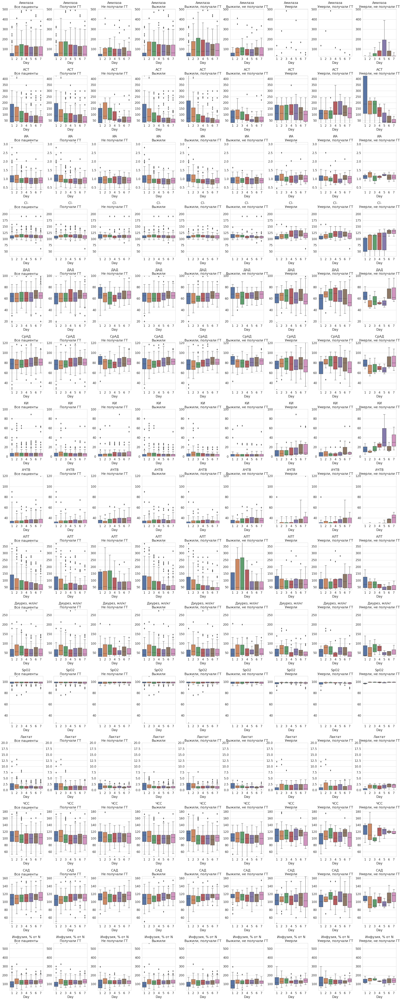

In [13]:
tab_list = [df_all,df_gt,df_nogt, df_surv, df_surv_gt, df_surv_nogt, df_died, df_died_gt, df_died_nogt]
tab_lists = ['Все пациенты','Получали ГТ','Не получали ГТ', 'Выжили', 'Выжили, получали ГТ', 'Выжили, не получали ГТ', 'Умерли', 'Умерли, получали ГТ','Умерли, не получали ГТ']
fig,axis = plt.subplots(15,9,figsize = (30,75))

for k,z in enumerate(params):
    if z!='КИ' and z!='Лактат':
        y_max = df_all[z].max()
        while y_max>(df_all[z].mean()*5):
            y_max = y_max/5
        y_min = df_all[z].min()
        while y_min<(df_all[z].mean()/5):
            y_min = (y_min+1)*5
    elif z=='КИ':
        y_max = 100
        y_min = 0
    elif z=='Лактат':
        y_max = 20
        y_min = 0
    for kk,i in enumerate(tab_list):
        sns.boxplot(x = tab_list[kk]['Day'], y = tab_list[kk][z],orient='vertical',ax=axis[k,kk],).set_ylabel(None)
        axis[k,kk].set_title(f'{z}\n{tab_lists[kk]}')
        axis[k,kk].set_ylim(y_min,y_max)
plt.tight_layout()
plt.show()

* не смотря на то, что на графиках бокс-плот видимой, бросающейся в глаза, разницы не обнаруживается, продолжим графический анализ: проанализируем динамику средних значений

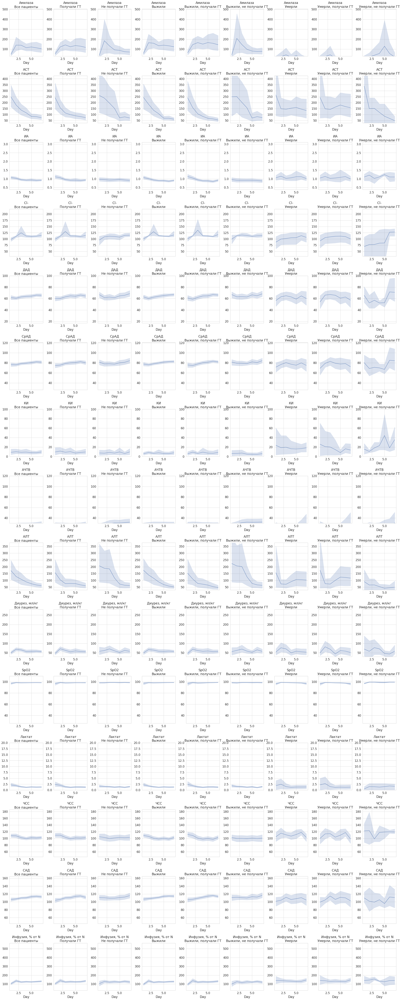

In [14]:
fig,axis = plt.subplots(15,9,figsize = (30,75))
for k,z in enumerate(params):
    if z!='КИ' and z!='Лактат':
        y_max = df_all[z].max()
        while y_max>(df_all[z].mean()*5):
            y_max = y_max/5
        y_min = df_all[z].min()
        while y_min<(df_all[z].mean()/5):
            y_min = (y_min+1)*5
    elif z=='КИ':
        y_max = 100
        y_min = 0
    elif z=='Лактат':
        y_max = 20
        y_min = 0
    for kk,i in enumerate(tab_list):
        sns.lineplot(x = tab_list[kk]['Day'], y = tab_list[kk][z],ax=axis[k,kk],).set_ylabel(None)
        axis[k,kk].set_title(f'{z}\n{tab_lists[kk]}')
        axis[k,kk].set_ylim(y_min,y_max)
plt.tight_layout()
plt.show()

**На графиках светло-голубым цветом обозначены доверительные интервалы средних значений: обращает на себя внимание разные доверительные интервалы средних значений для групп умерших и выживших (у выживших они Уже) и для подгрупп (ГТ+ и ГТ-) в этих же группах (в группах ГТ+ доверительные интервалы также Уже).**<br>
**В связи с этим добавим новые признаки: 2 стандартных отклонения средних значений для каждого параметра в меньшую и большую сторону.**

In [15]:
import warnings
warnings.filterwarnings("ignore")
for i in params:
    i_std_min = str(i+'_std_min')
    i_std_max = str(i+'_std_max')
    for tab in tab_list:
        tab[i_std_min] = tab[i].mean() - tab[i].std(ddof=1)*2 / np.sqrt(tab.shape[0])
        tab[i_std_max] = tab[i].mean() + tab[i].std(ddof=1)*2 / np.sqrt(tab.shape[0])


**Теперь с помощью метода Краскела-Уоллиса попытаемся определить, есть ли значимые различия между группами пациентов по изучаемым параметрам**<br>
Выбор данного критерия обусловлен непараметрическим распределением данных, независимостью анализируемых выборок (в сформированных группах пациенты не переходят из одной группы в другую) и количеством групп более 2.

In [16]:
pd.options.display.max_rows = 350
params2 = df_all.columns[2:].drop(['OUTCOME','GT'])
results2 = []
for day in days:
    for i in params2:
        stat, p = stats.kruskal(df_all.loc[df_all.Day==day,i],df_gt.loc[df_gt.Day==day,i],\
                                df_nogt.loc[df_nogt.Day==day,i], df_surv.loc[df_surv.Day==day,i],\
                                df_surv_gt.loc[df_surv_gt.Day==day,i], df_surv_nogt.loc[df_surv_nogt.Day==day,i],\
                                df_died.loc[df_died.Day==day,i], df_died_gt.loc[df_died_gt.Day==day,i],\
                                df_died_nogt.loc[df_died_nogt.Day==day,i])
        if p<0.05:
            results2.append([i,day,round(p,4)])
        else:
            results2.append([i,day,round(p,4)])
result2_df = pd.DataFrame(results2,columns=['Параметр','День','p-value'])
result2_df.groupby('Параметр',as_index=False).mean()[['Параметр','p-value']].sort_values('p-value')

,Параметр,p-value
23,"Диурез, мл/кг_std_max",0.000000
46,ЧСС_std_max,0.000000
24,"Диурез, мл/кг_std_min",0.000000
26,ИА_std_max,0.000000
27,ИА_std_min,0.000000
29,"Инфузия, % от N_std_max",0.000000
30,"Инфузия, % от N_std_min",0.000000
21,ДАД_std_min,0.000000
32,КИ_std_max,0.000000
35,Лактат_std_max,0.000000


* В данном случае выявлено, что верхние и нижние границы доверительных интервалов для среднего значения достоверно различаются для разных групп.
* в данном случае границей было выбрано 2std, но очень маленькие значения p-values позволяют предположить, что можно было выбрать и более широкий диапазон (3 и более std)

Далее мы проведем поиск и анализ данных пациентов, значения параметров у которых "выбиваются" из ДИ среднего наиболее часто (использован порог 2/3 записей), т.е. будет предпринята попытка статистического анализа различий между выжившими и умершими пациентами, а также пациентами ГТ+ и ГТ-, которые наиболее сильно отклоняются от средних значений исследуемых параметров в своих группах; возможно, будет обнаружено значительное различие, например, в случае отклонения значений умерших пациентов в меньшую от среднего сторону, а выживших - в большую сторону от среднего значения.

Сначала составлен список пациентов, значения которых отклонялись более, чем на 1,96std

In [17]:
results3 = []
for k,tab in enumerate(tab_list):
    for patient in tab.ID.unique():
        for day in days:
            checks_true = []
            checks_false = []
            for param in params:
                std = tab.loc[tab['Day']==day,param].std(ddof=1)
                mean = tab.loc[tab['Day']==day,param].mean()
                if mean-1.96*std/np.sqrt(tab[tab['Day']==day].shape[0]) <= tab.loc[(tab['Day']==day)&(tab['ID']==patient),param].values < mean+1.96*std/np.sqrt(tab[tab['Day']==day].shape[0]):
                    checks_true.append(param)
                else:
                    checks_false.append(param)
            results3.append([tab_lists[k],patient,day,checks_true,checks_false])
#             print(f'День {day}: {param} находится в пределах среднее +/- 2std' if df_all.loc[df_all['Day']==day,param].mean()-2*df_all.loc[df_all['Day']==day,param].std(ddof=1)<=df_all.loc[(df_all['Day']==day)&(df_all['ID']==patient),param].values<df_all.loc[df_all['Day']==day,param].mean()-2*df_all.loc[df_all['Day']==day,param].std(ddof=1) else f'День {day}: {param} находится за пределами среднее +/- 2std')

In [18]:
results3_df = pd.DataFrame(results3, columns = ['Группа пациентов','ID пациента','День лечения','Параметр в пределах среднее +/- 1.96std','Параметры за пределами среднее +/-1.96std'])
results3_df['Количество параметров за пределами 1.96std'] = [len(i) for i in results3_df['Параметры за пределами среднее +/-1.96std']]
results3_df.head()

,Группа пациентов,ID пациента,День лечения,Параметр в пределах среднее +/- 1.96std,Параметры за пределами среднее +/-1.96std,Количество параметров за пределами 1.96std
0,Все пациенты,3,1,"[Амилаза, Cl-, АЧТВ, Диурез, мл/кг]","[АСТ, ИА, ДАД, СрАД, КИ, АЛТ, SpO2, Лактат, ЧС...",11
1,Все пациенты,3,2,"[Амилаза, Cl-]","[АСТ, ИА, ДАД, СрАД, КИ, АЧТВ, АЛТ, Диурез, мл...",13
2,Все пациенты,3,3,"[Cl-, АЧТВ, Инфузия, % от N]","[Амилаза, АСТ, ИА, ДАД, СрАД, КИ, АЛТ, Диурез,...",12
3,Все пациенты,3,4,"[Амилаза, АСТ, ДАД, СрАД, АЧТВ, ЧСС, САД]","[ИА, Cl-, КИ, АЛТ, Диурез, мл/кг, SpO2, Лактат...",8
4,Все пациенты,3,5,"[АСТ, ДАД, СрАД, АЧТВ, САД]","[Амилаза, ИА, Cl-, КИ, АЛТ, Диурез, мл/кг, SpO...",10


In [19]:
print("Количество значений, отклоняющихся от среднего более, чем на 1.96 std в группе ГТ-")
results3_df[results3_df['Группа пациентов']=='Не получали ГТ'].sort_values('Количество параметров за пределами 1.96std',ascending=False)['Количество параметров за пределами 1.96std'].sum()

Количество значений, отклоняющихся от среднего более, чем на 1.96 std в группе ГТ-


1655

In [20]:
print("Количество значений, отклоняющихся от среднего более, чем на 1.96 std в группе ГТ+")
results3_df[results3_df['Группа пациентов']=='Получали ГТ'].sort_values('Количество параметров за пределами 1.96std',ascending=False)['Количество параметров за пределами 1.96std'].sum()

Количество значений, отклоняющихся от среднего более, чем на 1.96 std в группе ГТ+


4431

Также получен список пациентов, значения которых отклонялись на 1std от среднего

In [21]:
results4 = []
for k,tab in enumerate(tab_list):
    for patient in tab.ID.unique():
        for day in days:
            checks_true = []
            checks_false = []
            for param in params:
                std = tab.loc[tab['Day']==day,param].std(ddof=1)
                mean = tab.loc[tab['Day']==day,param].mean()
                if mean-1*std/np.sqrt(tab[tab['Day']==day].shape[0]) <= tab.loc[(tab['Day']==day)&(tab['ID']==patient),param].values < mean+1*std/np.sqrt(tab[tab['Day']==day].shape[0]):
                    checks_true.append(param)
                else:
                    checks_false.append(param)
            results4.append([tab_lists[k],patient,day,checks_true,checks_false])

In [22]:
results4_df = pd.DataFrame(results4, columns = ['Группа пациентов','ID пациента','День лечения','Параметр в пределах среднее +/- 1std','Параметры за пределами среднее +/-1std'])
results4_df['Количество параметров за пределами 1std'] = [len(i) for i in results4_df['Параметры за пределами среднее +/-1std']]
results4_df.head()

,Группа пациентов,ID пациента,День лечения,Параметр в пределах среднее +/- 1std,Параметры за пределами среднее +/-1std,Количество параметров за пределами 1std
0,Все пациенты,3,1,"[АЧТВ, Диурез, мл/кг]","[Амилаза, АСТ, ИА, Cl-, ДАД, СрАД, КИ, АЛТ, Sp...",13
1,Все пациенты,3,2,[Cl-],"[Амилаза, АСТ, ИА, ДАД, СрАД, КИ, АЧТВ, АЛТ, Д...",14
2,Все пациенты,3,3,"[Инфузия, % от N]","[Амилаза, АСТ, ИА, Cl-, ДАД, СрАД, КИ, АЧТВ, А...",14
3,Все пациенты,3,4,"[Амилаза, АСТ, ДАД, СрАД]","[ИА, Cl-, КИ, АЧТВ, АЛТ, Диурез, мл/кг, SpO2, ...",11
4,Все пациенты,3,5,"[АСТ, ДАД, СрАД, САД]","[Амилаза, ИА, Cl-, КИ, АЧТВ, АЛТ, Диурез, мл/к...",11


In [23]:
print("Количество значений, отклоняющихся от среднего более, чем на 1 std в группе ГТ-")
results4_df[results4_df['Группа пациентов']=='Не получали ГТ'].sort_values('Количество параметров за пределами 1std',ascending=False)['Количество параметров за пределами 1std'].sum()

Количество значений, отклоняющихся от среднего более, чем на 1 std в группе ГТ-


2092

In [24]:
print("Количество значений, отклоняющихся от среднего более, чем на 1 std в группе ГТ+")
results4_df[results4_df['Группа пациентов']=='Получали ГТ'].sort_values('Количество параметров за пределами 1std',ascending=False)['Количество параметров за пределами 1std'].sum()

Количество значений, отклоняющихся от среднего более, чем на 1 std в группе ГТ+


5249

In [25]:
print(f'{len(params)} параметров\n{df_gt.ID.nunique()} пациентов получали ГТ\n{df_nogt.ID.nunique()} пациентов не получали ГТ')

15 параметров
58 пациентов получали ГТ
24 пациентов не получали ГТ


**Итак: всего 15 наблюдаемых параметров**
- Интервал 1,96 сигмы:

**В группе не получавших ГТ: 24 пациентов** - и в ней всего 1655 из 15х24х7=2520 (т.е. 65.67%)  записей не попадают в пределы средних значений.<br>
**В группе, получавшей ГТ: 58 пациента** - и в ней всего 4431 из 15(параметров)х58(пациентов)х7(дней)=6090 (т.е. 72.76%) записей не попадают в пределы средних значений

- Интервал 1 сигма:

**В группе не получавших ГТ: 24 пациентов** - и в ней всего 2092 из 15х24х7=2520 (т.е. 83.02%)  записей не попадают в пределы средних значений.<br>
**В группе, получавшей ГТ: 58 пациента** - и в ней всего 5249 из 15(параметров)х58(пациентов)х7(дней)=6090 (т.е. 86.19%) записей не попадают в пределы средних значений

- Т.о. порядка 65-86% записей пациентов, получавших ГТ и не получавших ГТ сильно "оторваны" от других записей (т.е. расстояние между ними больше или равно 1 сигме); при этом в более узком нормальном распределении наблюдается около 68% значений в пределах 1 сигмы от наблюдаемого среднего - и, соответственно, только 32% за пределами 1 сигмы.
- Это еще раз подтверждает непараметричность распределения исследуемых значений;
- Это же свидетельствует о значительных колебаниях параметров пациентов в каждой группе, а значит, пациенты в разные дни имеют разные характеристики, и результаты ранее проведенного теста Фридмана также заслуживают доверия.

**Ниже мы посмотрим, что это за пациенты: сколько параметров у каждого из них далеко отстоит от среднего по выборке (т.е. "группе").**

In [119]:
a = results3_df[results3_df['Группа пациентов']=='Получали ГТ'].sort_values('Количество параметров за пределами 1.96std',ascending=False).groupby(['ID пациента','День лечения'],as_index=False)['Количество параметров за пределами 1.96std'].sum()
# a.head(50)

In [120]:
b = results3_df[results3_df['Группа пациентов']=='Не получали ГТ'].sort_values('Количество параметров за пределами 1.96std',ascending=False).groupby(['ID пациента','День лечения'],as_index=False)['Количество параметров за пределами 1.96std'].sum()
# b

In [121]:
a = a.rename(columns={'ID пациента':'ID'}).groupby('ID',as_index=False).sum().sort_values('Количество параметров за пределами 1.96std')[['ID','Количество параметров за пределами 1.96std']].merge(df.groupby('ID',as_index=False)[['Day','OUTCOME']].max(),on='ID',how='left')
a['Количество записей'] = 15 * a['Day']
a['За переделами ДИ, %'] = a['Количество параметров за пределами 1.96std'] * 100 / a['Количество записей']
a.sort_values('За переделами ДИ, %',ascending=False)

,ID,Количество параметров за пределами 1.96std,Day,OUTCOME,Количество записей,"За переделами ДИ, %"
53,94,90,7,Died,105,85.714286
56,201,98,8,Survived,120,81.666667
49,125,85,7,Survived,105,80.952381
47,49,84,7,Survived,105,80.000000
43,128,82,7,Died,105,78.095238
44,121,82,7,Survived,105,78.095238
45,122,82,7,Died,105,78.095238
55,79,93,8,Died,120,77.500000
35,6,80,7,Survived,105,76.190476
38,8,80,7,Survived,105,76.190476


In [122]:
b = b.rename(columns={'ID пациента':'ID'}).groupby('ID',as_index=False).sum().sort_values('Количество параметров за пределами 1.96std')[['ID','Количество параметров за пределами 1.96std']].merge(df.groupby('ID',as_index=False)[['Day','OUTCOME']].max(),on='ID',how='left')
b['Количество записей'] = 15 * b['Day']
b['За переделами ДИ, %'] = a['Количество параметров за пределами 1.96std'] * 100 / a['Количество записей']
b.sort_values('За переделами ДИ, %',ascending=False)

,ID,Количество параметров за пределами 1.96std,Day,OUTCOME,Количество записей,"За переделами ДИ, %"
8,83,64,12,Survived,180,64.761905
9,51,68,8,Survived,120,64.761905
21,45,79,8,Survived,120,61.666667
17,82,74,9,Survived,135,59.166667
15,129,73,7,Died,105,58.333333
12,72,71,12,Survived,180,57.500000
11,93,70,11,Died,165,57.500000
5,99,61,8,Survived,120,55.833333
7,105,62,11,Survived,165,55.833333
3,63,59,19,Survived,285,53.333333


- анализируемые пациенты лечились не менее 7 дней; исследуются 15 параметров, значит, каждый из них имел как минимум 7*15 записей (=105).

In [123]:
patients = a[a['За переделами ДИ, %']>35]['ID'].unique()
df.loc[df.ID.isin(patients),['ID','OUTCOME']].groupby('ID').min().sort_values('OUTCOME').value_counts()

OUTCOME 
Survived    31
Died         9
dtype: int64

* 9 из 11 умерших пациентов, получавших ГТ, отклонялись на 1.96 и более сигм от среднего своей группы (т.е. группы, получавшей ГТ) по более чем 5% случаев наблюдения за исследуемыми параметрами; при этом мы проанализировали всего 14 умерших пациентов (остальные умерли ранее 7 дня или не получали ГТ); выживших в этом списке - 31 человек (всего - 47; см. подробный состав групп в начале).
* далее мы отдельно проанализируем и сравним этих 9 умерших и 31 выживших пациента

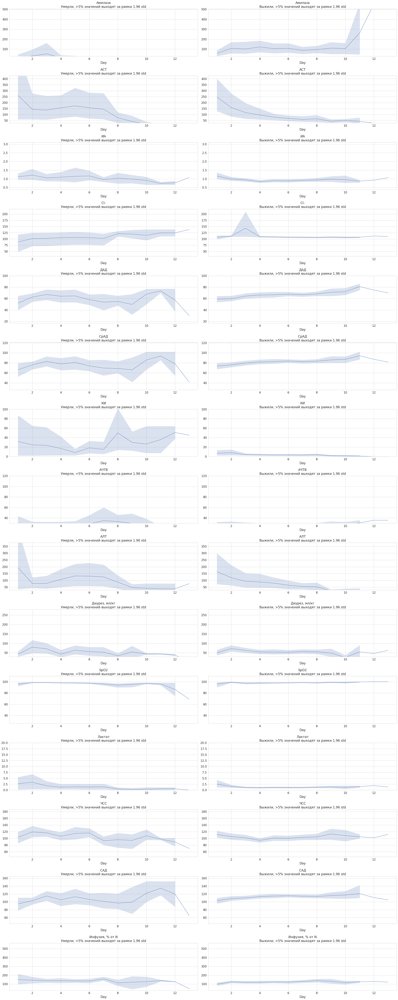

In [31]:
tab_list = [df.loc[(df.ID.isin(patients))&(df.OUTCOME=='Died'),:],df.loc[(df.ID.isin(patients))&(df.OUTCOME=='Survived'),:]]
tab_lists = ['Умерли, >35% значений выходят за рамки 1.96 std','Выжили, >35% значений выходят за рамки 1.96 std']
fig,axis = plt.subplots(15,2,figsize = (30,75))
for k,z in enumerate(params):
    if z!='КИ' and z!='Лактат':
        y_max = df_all[z].max()
        while y_max>(df_all[z].mean()*5):
            y_max = y_max/5
        y_min = df_all[z].min()
        while y_min<(df_all[z].mean()/5):
            y_min = (y_min+1)*5
    elif z=='КИ':
        y_max = 100
        y_min = 0
    elif z=='Лактат':
        y_max = 20
        y_min = 0
    for kk,i in enumerate(tab_list):
        sns.lineplot(x = tab_list[kk]['Day'], y = tab_list[kk][z],ax=axis[k,kk],).set_ylabel(None)
        axis[k,kk].set_title(f'{z}\n{tab_lists[kk]}')
        axis[k,kk].set_ylim(y_min,y_max)
plt.tight_layout()
plt.show()

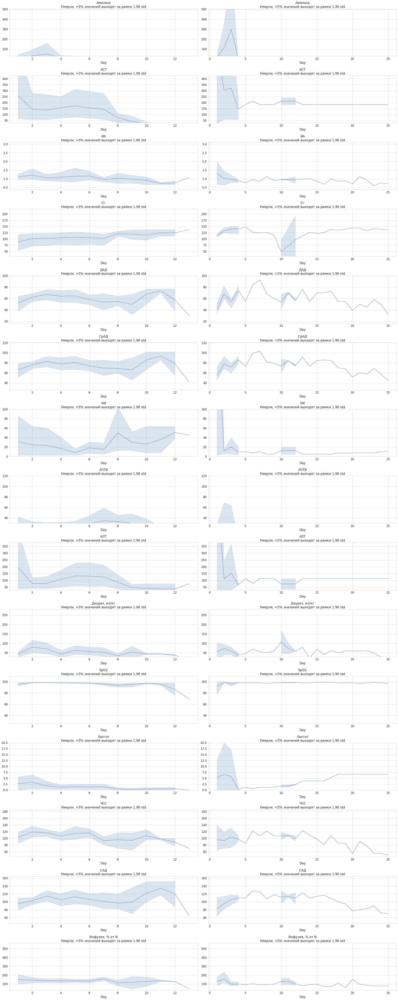

In [32]:
tab_list = [df.loc[(df.ID.isin(patients))&(df.OUTCOME=='Died'),:],df.loc[(~df.ID.isin(patients))&(df.OUTCOME=='Died')&(df.GT==1),:]]
tab_lists = ['Умерли, >5% значений выходят за рамки 1.96 std','Умерли, <5% значений выходят за рамки 1.96 std']
fig,axis = plt.subplots(15,2,figsize = (30,75))
for k,z in enumerate(params):
    if z!='КИ' and z!='Лактат':
        y_max = df_all[z].max()
        while y_max>(df_all[z].mean()*5):
            y_max = y_max/5
        y_min = df_all[z].min()
        while y_min<(df_all[z].mean()/5):
            y_min = (y_min+1)*5
    elif z=='КИ':
        y_max = 100
        y_min = 0
    elif z=='Лактат':
        y_max = 20
        y_min = 0
    for kk,i in enumerate(tab_list):
        sns.lineplot(x = tab_list[kk]['Day'], y = tab_list[kk][z],ax=axis[k,kk],).set_ylabel(None)
        axis[k,kk].set_title(f'{z}\n{tab_lists[kk]}')
        axis[k,kk].set_ylim(y_min,y_max)
plt.tight_layout()
plt.show()

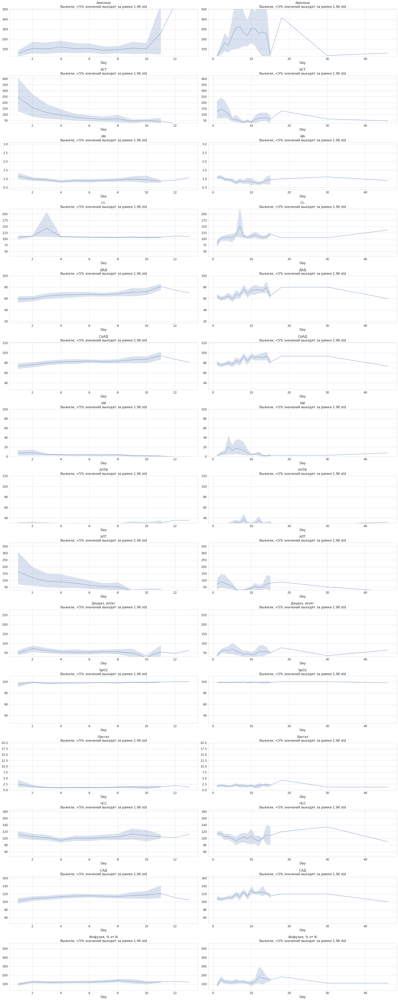

In [33]:
tab_list = [df.loc[(df.ID.isin(patients))&(df.OUTCOME=='Survived'),:],df.loc[(~df.ID.isin(patients))&(df.OUTCOME=='Survived')&(df.GT==1),:]]
tab_lists = ['Выжили, >5% значений выходят за рамки 1.96 std','Выжили, <5% значений выходят за рамки 1.96 std']
fig,axis = plt.subplots(15,2,figsize = (30,75))
for k,z in enumerate(params):
    if z!='КИ' and z!='Лактат':
        y_max = df_all[z].max()
        while y_max>(df_all[z].mean()*5):
            y_max = y_max/5
        y_min = df_all[z].min()
        while y_min<(df_all[z].mean()/5):
            y_min = (y_min+1)*5
    elif z=='КИ':
        y_max = 100
        y_min = 0
    elif z=='Лактат':
        y_max = 20
        y_min = 0
    for kk,i in enumerate(tab_list):
        sns.lineplot(x = tab_list[kk]['Day'], y = tab_list[kk][z],ax=axis[k,kk],).set_ylabel(None)
        axis[k,kk].set_title(f'{z}\n{tab_lists[kk]}')
        axis[k,kk].set_ylim(y_min,y_max)
plt.tight_layout()
plt.show()

In [34]:
# Умершие и получавшие ГТ, выходящие >5% раз за пределы 1.96 std
df.loc[(df.ID.isin(patients))&(df.OUTCOME=='Died'),params].describe().T

,count,mean,std,min,25%,50%,75%,max
Амилаза,81.0,15.716049,65.716291,0.000000,0.000000,0.000000,0.000000,485.000000
АСТ,81.0,138.992593,230.256034,0.000000,38.000000,104.000000,120.500000,1678.400000
ИА,81.0,1.071906,0.419976,0.512500,0.811966,1.000000,1.196078,3.100000
Cl-,81.0,105.944444,38.500568,0.000000,101.500000,111.000000,124.000000,159.000000
ДАД,81.0,59.543210,17.674169,17.000000,50.000000,60.000000,75.000000,99.000000
СрАД,81.0,74.962963,20.015827,26.333333,60.000000,75.666667,90.000000,120.666667
КИ,81.0,24.203704,44.244829,0.000000,4.000000,7.500000,20.000000,246.000000
АЧТВ,81.0,25.203704,22.245755,0.000000,0.000000,29.000000,38.000000,120.000000
АЛТ,81.0,107.038272,164.535558,0.000000,42.800000,66.000000,112.000000,1293.200000
"Диурез, мл/кг",81.0,54.841746,37.424546,2.325581,31.000000,42.500000,70.930233,179.500000


In [35]:
# Умершие и получавшие ГТ, выходящие <5% раз за пределы 1.96 std
zz = df.loc[(~df.ID.isin(patients))&(df.OUTCOME=='Died')&(df.GT==1),'ID'].unique()
df.loc[df['ID'].isin(zz),params].describe().T

,count,mean,std,min,25%,50%,75%,max
Амилаза,51.0,37.117647,155.360439,0.000000,0.000000,0.000000,0.000000,892.000000
АСТ,51.0,249.749020,359.553565,0.000000,135.750000,183.000000,241.000000,2458.300000
ИА,51.0,0.981681,0.310853,0.464000,0.834250,0.939759,1.004505,2.285714
Cl-,51.0,104.198039,54.367492,1.200000,107.000000,122.000000,139.000000,193.000000
ДАД,51.0,58.294118,15.811760,30.000000,46.500000,58.000000,70.000000,93.000000
СрАД,51.0,72.660131,15.457970,43.333333,60.166667,73.333333,85.000000,105.333333
КИ,51.0,31.649020,134.363695,0.000000,5.000000,7.500000,12.500000,956.600000
АЧТВ,51.0,14.760784,41.795861,0.000000,0.000000,0.000000,0.000000,162.000000
АЛТ,51.0,150.007843,396.617281,0.000000,37.000000,113.000000,113.000000,2865.000000
"Диурез, мл/кг",51.0,55.783472,32.164732,0.000000,38.666667,56.666667,72.166667,169.230769


In [36]:
# Выжившие и получавшие ГТ, выходящие >5% раз за пределы 1.96 std
df.loc[(df.ID.isin(patients))&(df.OUTCOME=='Survived'),params].describe().T

,count,mean,std,min,25%,50%,75%,max
Амилаза,264.0,104.539356,140.185331,0.000000,0.000000,53.500000,145.200000,858.100000
АСТ,264.0,106.268750,196.706595,0.000000,30.437500,48.700000,95.250000,1958.500000
ИА,264.0,0.946932,0.301329,0.461538,0.771576,0.904762,1.060256,2.800000
Cl-,264.0,112.119129,61.881770,0.000000,104.000000,108.300000,113.000000,1102.000000
ДАД,264.0,65.439394,12.718513,20.000000,57.750000,65.000000,72.500000,100.000000
СрАД,264.0,80.969697,12.533888,30.000000,73.333333,80.000000,88.666667,117.666667
КИ,264.0,4.190379,9.015911,0.000000,0.000000,0.000000,5.000000,80.000000
АЧТВ,264.0,25.939015,14.291912,0.000000,25.000000,30.000000,33.825000,90.000000
АЛТ,264.0,85.005303,170.427448,0.000000,17.500000,31.100000,80.550000,1885.200000
"Диурез, мл/кг",264.0,56.487498,35.743002,6.250000,29.982143,48.166667,75.000000,213.333333


In [37]:
# Выжившие и получавшие ГТ, выходящие <5% раз за пределы 1.96 std
zz = df.loc[(~df.ID.isin(patients))&(df.OUTCOME=='Survived')&(df.GT==1),'ID'].unique()
df.loc[df['ID'].isin(zz),params].describe().T

,count,mean,std,min,25%,50%,75%,max
Амилаза,554.0,138.084513,192.806744,0.000000,42.250000,79.000000,160.450000,1940.000000
АСТ,554.0,82.380325,168.885571,0.000000,30.925000,47.000000,71.200000,2130.600000
ИА,554.0,0.972563,0.266893,0.200000,0.783385,0.937278,1.104809,2.133333
Cl-,554.0,107.688357,31.358233,0.000000,104.000000,108.000000,116.000000,507.000000
ДАД,554.0,66.402527,11.813135,5.000000,60.000000,65.000000,75.000000,110.000000
СрАД,554.0,81.938026,11.496082,40.000000,73.333333,83.333333,90.000000,116.666667
КИ,554.0,6.798755,16.423892,0.000000,0.000000,5.000000,6.212500,199.200000
АЧТВ,554.0,27.551895,14.050507,0.000000,25.500000,30.825000,34.950000,125.000000
АЛТ,554.0,62.231480,102.358792,0.000000,24.800000,38.890000,62.000000,1260.700000
"Диурез, мл/кг",554.0,53.807995,35.933750,1.571429,30.000000,45.116883,68.592857,280.000000


In [38]:
pd.options.display.max_rows = 350
# params2 = df_all.columns[2:].drop(['OUTCOME','GT'])
results5 = []
df1 = df.loc[(df.ID.isin(patients))&(df.OUTCOME=='Survived'),:] # выжили, имели >35% случаев отклонения более 1.96*std
df2 = df.loc[(df.ID.isin(patients))&(df.OUTCOME=='Died'),:] # умерли, имели >35% случаев отклонения более 1.96*std
df3 = df.loc[(~df.ID.isin(patients))&(df.OUTCOME=='Survived')&(df.GT==1),:] # выжили, имели <35% случаев отклонения более 1.96*std
df4 = df.loc[(~df.ID.isin(patients))&(df.OUTCOME=='Died')&(df.GT==1),:] # умерли, имели <35% случаев отклонения более 2*std
for day in days:
    for i in params:
        stat, p = stats.kruskal(df1.loc[df1.Day==day,i],df2.loc[df2.Day==day,i],df3.loc[df3.Day==day,i],df4.loc[df4.Day==day,i])
#         print('*'*50)
#         print(i)
        if p<0.05:
            results5.append([i,day,round(p,4)])
#             print('Доказана существенная разница:',p)
        else:
            results5.append([i,day,round(p,4)])
#             print('Разница не доказана:',p)
results5_df = pd.DataFrame(results5,columns=['Параметр','День','p-value'])
results5_df.groupby('Параметр',as_index=False).mean()[['Параметр','p-value']].sort_values('p-value')

,Параметр,p-value
5,Амилаза,0.030986
0,Cl-,0.041643
10,КИ,0.084800
1,SpO2,0.141471
3,АСТ,0.219786
4,АЧТВ,0.242843
6,ДАД,0.287314
2,АЛТ,0.327914
14,ЧСС,0.330371
9,"Инфузия, % от N",0.334571


**Как видно, при различных принципах формирования выборок для сравнения, убедительных данных о значимом различии выборок между собой по принципу использования ГТ не наблюдается.**<br>
**Далее мы попытаемся оценить различия между группами пациентов в случаях однократного (в первый день) и многократного (больше одного дня, а также однократного после 1го дня) использования ГТ.**

---

## Анализ продолжительности использования ГТ
* данный анализ проведен в несколько (5) этапов

### Этап 1
#### Пациенты делятся на 2 группы:

1. Получает гормонотерапию в первый день
2. Не получает гормонотерапию в первый день.

**Ограничения: решение о назначении гормонотерапии (ГТ) определялось исходя из наличия показаний.**

#### Нулевая гипотеза: разницы между группами нет.

Просмотр первых 5 записей

In [39]:
# 1й день - день поступления пациента
df_1 = df[df['Day']==1].copy()
df_1.head()

,ID,Day,Возраст,GT,САД,ДАД,СрАД,ЧСС,ИА,SpO2,...,Лактат,Амилаза,АЛТ,АСТ,АЧТВ,"Инфузия, % от N",КИ,Площадь тела,"Диурез, мл/кг",OUTCOME
0,1,1,6.00,0.0,100.0,65.0,76.666667,108.0,1.080000,100.0,...,0.0,94.2,50.2,86.0,23.6,130.487805,0.0,0.7300,43.500000,Survived
6,2,1,0.42,0.0,100.0,66.0,77.333333,115.0,1.150000,100.0,...,0.0,18.3,31.3,46.0,31.5,124.255952,5.0,0.2908,23.571429,Survived
12,3,1,13.00,1.0,120.0,80.0,93.333333,80.0,0.666667,100.0,...,0.0,38.8,40.8,90.3,26.0,73.750000,0.0,1.1500,50.909091,Survived
31,4,1,8.00,0.0,110.0,65.0,80.000000,124.0,1.127273,100.0,...,0.0,15.3,11.2,35.3,29.1,294.736842,5.0,0.8500,25.666667,Survived
36,5,1,11.00,1.0,115.0,75.0,88.333333,110.0,0.956522,98.0,...,0.0,65.6,27.4,52.5,26.9,36.666667,0.0,1.0300,29.400000,Survived


Описательная статистика:
    группа 1

In [40]:
# Пациенты, которые получали ГТ имеют параметр GT=1
df_1_1 = df_1[df_1['GT']==1].loc[:,target_columns]
df_1_1.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,88.0,106.375000,64.528228,3.000000,47.750000,99.500000,162.250000,215.000000
Day,88.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Возраст,88.0,8.797348,5.160294,0.250000,4.000000,8.500000,13.000000,17.000000
GT,88.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
САД,88.0,104.795455,21.548213,45.000000,90.000000,106.500000,118.500000,155.000000
ДАД,88.0,60.034091,15.818256,17.000000,50.000000,60.500000,70.000000,100.000000
СрАД,88.0,74.954545,16.927098,26.333333,66.666667,77.666667,85.666667,113.333333
ЧСС,88.0,111.465909,24.578726,54.000000,96.000000,112.500000,122.000000,172.000000
ИА,88.0,1.128057,0.422854,0.412903,0.855820,1.078499,1.273694,2.800000
SpO2,88.0,97.272727,8.681765,26.000000,98.000000,99.000000,100.000000,100.000000


Описательная статистика: группа 2

In [41]:
# Пациенты, которые не получали ГТ имеют параметр GT=0
df_1_0 = df_1[df_1['GT']==0].loc[:,target_columns]
df_1_0.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,115.0,102.408696,59.924499,1.000000,53.000000,102.000000,150.000000,216.000000
Day,115.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Возраст,115.0,9.192725,5.549760,0.250000,4.000000,9.000000,14.500000,18.000000
GT,115.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
САД,115.0,106.460870,17.396454,70.000000,92.500000,110.000000,120.000000,159.000000
ДАД,115.0,63.678261,13.223814,30.000000,55.500000,60.000000,70.000000,119.000000
СрАД,115.0,77.939130,13.730104,43.333333,68.833333,77.333333,86.333333,117.333333
ЧСС,115.0,109.913043,22.587671,40.000000,92.000000,110.000000,125.000000,165.000000
ИА,115.0,1.069361,0.327999,0.407692,0.825121,1.000000,1.211702,2.133333
SpO2,115.0,98.252174,3.942222,70.000000,98.000000,100.000000,100.000000,100.000000


In [42]:
# сравнение средних
a = pd.DataFrame(df_1_1[target_columns[2:-1]].mean()).rename(columns = {0:'Группа 1: получает ГТ'})
a_ = []
for i in target_columns[2:-1]:    
          a_.append(df_1_0[df_1_0[i]>0][i].mean())
a['Группа 2: не получает ГТ'] = a_
a

,Группа 1: получает ГТ,Группа 2: не получает ГТ
Возраст,8.797348,9.192725
GT,1.000000,NaN
САД,104.795455,106.460870
ДАД,60.034091,63.678261
СрАД,74.954545,77.939130
ЧСС,111.465909,109.913043
ИА,1.128057,1.069361
SpO2,97.272727,98.252174
Масса тела,36.119318,35.856522
Cl-,90.795455,109.912000


**При простом сравнении средних значений видны не самые сильные различия, которые можно было бы ожидать: в группе, получавшей ГТ чуть меньше АД, чуть выше ЧСС и индекс Альговера, ниже уровень ионов хлора, АЛТ, АСТ, АЧТВ, объем назначенной инфузии и катехоламинов.**<br>
**Заранее можно сказать, что такие близкие значения средних, даже при значимости различий, являются признаком того, что величины параметров в двух группах сильно перекрываются, а значит, не смогут служить явной границей между этими группами пациентов. Однако, они могут иметь пользу для алгоритмов машинного обучения, которые могут анализировать влияние большого количества факторов на целевую переменную.**

In [43]:
# Размер выборки
print(f'Количество пациентов в группах:\nПервая группа\t{df_1_1.ID.nunique()}\nВторая группа\t{df_1_0.ID.nunique()}')

Количество пациентов в группах:
Первая группа	88
Вторая группа	115


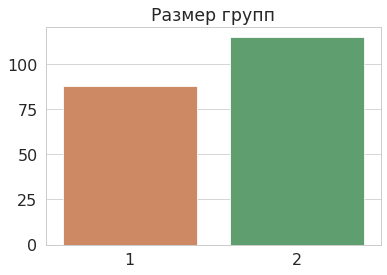

In [44]:
sns.barplot(data = [[0],[df_1_1.ID.nunique()],[df_1_0.ID.nunique()]])
plt.xlim(0.5)
plt.title('Размер групп');

#### Гистограммы значений параметров.
**Гистограммы построены для того, чтобы визуально оценить нормальность распределения признаков: видно, что только в случае среднего артериального давления в группе без ГТ можно наблюдать близкое к нормальному распределение. Поэтому дальше мы будем использовать непараметрический тест Краскела-Уоллиса для независимых выборок разного размера.**<br>
**На этих гистограммах также более удобно оценить медиану (изучается в тесте Краскела-Уоллиса) каждого параметра.**

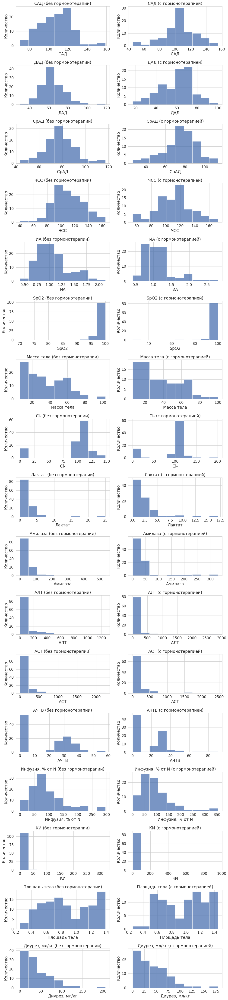

In [45]:
figure,ax = plt.subplots(len(target_columns[4:-1]),2,figsize=(14,60))
sns.set(style='whitegrid', rc={"grid.linewidth": 0.1})
sns.set_context("paper", font_scale=1.8)
for k,i in enumerate(target_columns[4:-1]):
    sns.histplot(df_1[df_1['GT']==0][i],bins=10,ax=ax[k,0])
    sns.histplot(df_1[df_1['GT']==1][i],bins=10,ax=ax[k,1])
    ax[k,0].set_title(i+' (без гормонотерапии)')
    ax[k,1].set_title(i+' (с гормонотерапией)')
    ax[k,0].set(ylabel='Количество')
    ax[k,1].set(ylabel='Количество')
plt.tight_layout()

* На графиках четко видна асимметричность распределения величин в двух выборках, 2 и более пика или резкое преобладание одного значения параметра над другими. Только два параметра (среднее АД и диастолическое АД) в группе пациентов, не получавшей ГТ, имеет близкое к нормальному распределение.
* т.к. графики далеки от нормального распределения, проверка на значимость различий выполнена с использованием критерия **Краскела-Уоллиса** (реализация критерия в sklearn позволяет анализировать от 2х групп)

In [46]:
columns = ['Вариант','Показатель','Значимость различий','p_value','alpha']
append_list = []
for k,i in enumerate(target_columns[4:-1]):
    group0 = df_1[df_1['GT']==0][i]
    group1 = df_1[df_1['GT']==1][i]
    alpha = 0.05
    test_value, p  = stats.kruskal(group0,group1)
    if alpha<p:
        append_list.append(['Этап 1',i,'значимость различия не доказана',p,alpha])
    else:
        append_list.append(['Этап 1',i,'обнаружены значимые различия',p,alpha])
        
# Для текстового вывода результатов - раскомментируйте данные строки;        
#     if alpha<p:
#         print(f'Разница по параметру {i} между двумя группами не доказана.')
#         print(f'\tСтатистика теста = {test_value}, p-значение = {p}')
#     else:
#         print(f'По параметру {i} наблюдается статистически достоверная разница между двумя группами.')
#         print(f'\tСтатистика теста = {test_value}, p-значение = {p}')

#### На основе проведенного теста (результаты приведены в сводной таблице ниже) можно сделать вывод, что различий между двумя группами пациентов по исследуемым параметрам не наблюдается; это подтверждается графически и с помощью теста Краскела-Уоллиса.
* Исходя из этого, можно предположить 2 варианта:
    - подобранная терапия обеспечивает относительную стабилизацию состояния уже в первые сутки: группы пациентов, нуждающиеся в ГТ и не нуждающиеся в ней, имеют сходные гемодинамические и биохимические показатели;
    - ГТ фактически никак не влияет на гемодинамические и биохимические показатели, а между группами пациентов просто нет существенной разницы; это предположение, вероятно, следует отклонить, т.к. гемодинамические эффекты глюкокортикоидов достаточно хорошо изучены.

### Этап 2
#### Пациенты делятся на 2 группы:

1. Получает гормонотерапию **только в первый день**.
2. Получает гормонотерапию **в первый И последующие дни**.

#### Нулевая гипотеза: разницы между группами нет.

In [47]:
# Составление списков пациентов получавших ГТ более 1 дня и только один (первый) день
# выбираем из датасета df  Day>1, GT = 1 и только тех пациентов, которые находятся в списке df_1_gt_1 (получали ГТ в первый день)
df_1_gt_1 = df.loc[(df.GT==1) & (df.Day==1),'ID'].unique()
a = df.loc[(df['Day']>1)&(df['ID'].isin(df_1_gt_1)),:].groupby('ID', as_index=False).max()
df_gt_more1day = df.loc[df.ID.isin(a.loc[a.GT==1,'ID']),:]
print(f'{df_gt_more1day["ID"].nunique()} получали ГТ более 1 дня.')
# есть данные и за 1 и за остальные дни; но в первый день они получали ГТ, а в др.дни - не получали
df_gt_only1day = df.loc[df.ID.isin(a.loc[a.GT==0,'ID']),:]
print(f'{df_gt_only1day["ID"].nunique()} получали ГТ только в 1й день')

67 получали ГТ более 1 дня.
12 получали ГТ только в 1й день


In [48]:
# не было ни одного пациента, который бы получал ГТ и находился в ОРИТ только 1 день
df.loc[(df['Day'].max()==1)&(df['ID'].isin(df_1_gt_1)),:].groupby('ID', as_index=False).max().shape[0]

0

In [49]:
# Размер выборки
print(f'Количество пациентов в группах:\nПервая группа\t{df_gt_only1day.ID.nunique()}\nВторая группа\t{df_gt_more1day.ID.nunique()}')

Количество пациентов в группах:
Первая группа	12
Вторая группа	67


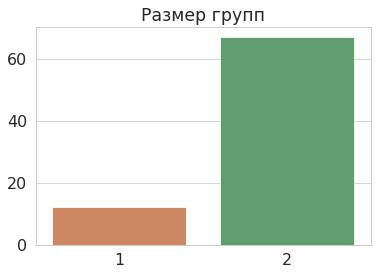

In [50]:
sns.barplot(data = [[0],[df_gt_only1day["ID"].nunique()],[df_gt_more1day["ID"].nunique()]])
plt.xlim(0.5)
plt.title('Размер групп');

Описательная статистика: 1 группа

In [51]:
# Описательная статистика пациентов, которые получали ГТ только в 1й день
df_gt_only1day[target_columns[2:]].describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,62.0,7.338710,3.922167,3.000000,4.000000,6.125000,11.750000,15.000000
GT,62.0,0.193548,0.398304,0.000000,0.000000,0.000000,0.000000,1.000000
САД,62.0,110.774194,13.216258,80.000000,102.750000,113.500000,118.750000,150.000000
ДАД,62.0,63.887097,12.420376,35.000000,55.000000,63.000000,70.000000,100.000000
СрАД,62.0,79.516129,11.562561,50.000000,73.083333,77.500000,85.750000,116.666667
ЧСС,62.0,101.145161,19.627554,60.000000,89.000000,98.500000,118.250000,165.000000
ИА,62.0,0.933377,0.257408,0.500000,0.780200,0.865385,1.065152,2.062500
SpO2,62.0,98.774194,2.321809,90.000000,98.000000,99.000000,100.000000,110.000000
Масса тела,62.0,32.741935,22.338627,12.000000,15.000000,21.500000,57.500000,70.000000
Cl-,62.0,100.972581,27.622521,0.000000,101.175000,106.100000,110.750000,129.000000


Описательная статистика: 2 группа

In [52]:
# Описательная статистика пациентов, которые получали ГТ в 1й и любой (любые) последующие дни
df_gt_more1day[target_columns[2:]].describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,548.0,10.438564,5.361711,0.250000,5.000000,12.000000,16.000000,17.000000
GT,548.0,0.653285,0.476359,0.000000,0.000000,1.000000,1.000000,1.000000
САД,548.0,112.124088,17.412910,45.000000,104.000000,112.500000,120.000000,165.000000
ДАД,548.0,65.399635,13.792632,5.000000,60.000000,65.000000,75.000000,100.000000
СрАД,548.0,80.974453,14.174995,26.333333,73.333333,81.666667,90.083333,120.666667
ЧСС,548.0,105.155109,23.767145,41.000000,88.750000,105.000000,120.000000,186.000000
ИА,548.0,0.966663,0.312359,0.412903,0.775182,0.909091,1.090909,3.100000
SpO2,548.0,98.155109,4.290591,26.000000,98.000000,99.000000,100.000000,100.000000
Масса тела,548.0,42.937956,22.495475,6.000000,20.000000,45.000000,60.000000,100.000000
Cl-,548.0,108.689507,52.394270,0.000000,103.000000,108.000000,114.250000,1102.000000


In [53]:
# сравнение средних
a = pd.DataFrame(df_gt_more1day[target_columns[2:-1]].mean()).rename(columns = {0:'ГТ\: 1 и последующие дни'})
a_ = []
for i in target_columns[2:-1]:    
          a_.append(df_gt_only1day[df_gt_only1day[i]>0][i].mean())
a['ГТ: только 1й день'] = a_
a

,ГТ\: 1 и последующие дни,ГТ: только 1й день
Возраст,10.438564,7.338710
GT,0.653285,1.000000
САД,112.124088,110.774194
ДАД,65.399635,63.887097
СрАД,80.974453,79.516129
ЧСС,105.155109,101.145161
ИА,0.966663,0.933377
SpO2,98.155109,98.774194
Масса тела,42.937956,32.741935
Cl-,108.689507,107.936207


### Гистограммы значений и QQ-плот для оценки нормальности распределения
**В данном случае мы добавили график QQ-плот (квантиль-квантиль), т.к. в некоторых случаях при просмотре гистограмм неочевидно, что параметры имеют непараметрическое распределение.**

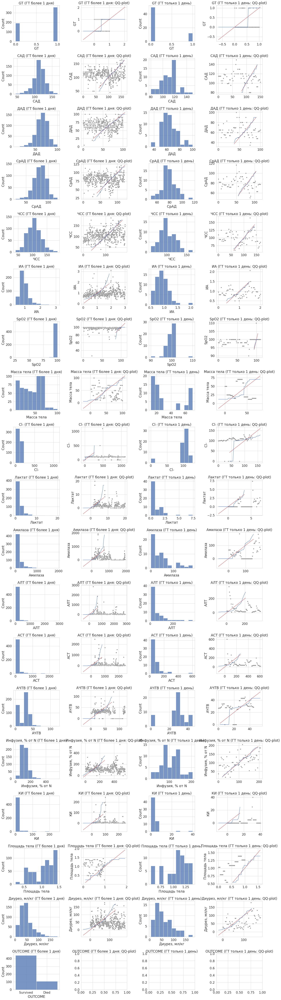

In [54]:
# for k,i in enumerate(target_columns[3:]):
#     print('Параметр =',i,'\nСреднее = ',df_gt_more1day[i].mean(),'std =',df_gt_more1day[i].std(ddof=1))
figure,ax = plt.subplots(len(target_columns[3:]),4,figsize=(19,70))
for k,i in enumerate(target_columns[3:]):
    try:
        sns.histplot(df_gt_more1day[i],bins=10,ax=ax[k,0])
        interval = np.linspace(0,1,int(df_gt_more1day[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(df_gt_more1day[i].count())),loc=df_gt_more1day[i].mean(),scale=df_gt_more1day[i].std(ddof=1))
        y = np.quantile(df_gt_more1day[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,1],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,1],color='b')
        sns.scatterplot(x = np.linspace(0,int(df_gt_more1day[i].max()),int(df_gt_more1day[i].count())),y = df_gt_more1day[i],ax=ax[k,1],color='grey')
        sns.histplot(df_gt_only1day[i],bins=10,ax=ax[k,2])
        interval = np.linspace(0,1,int(df_gt_only1day[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(df_gt_only1day[i].count())),loc=df_gt_only1day[i].mean(),scale=df_gt_only1day[i].std(ddof=1))
        y = np.quantile(df_gt_only1day[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,3],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,3],color='b')
        sns.scatterplot(x = np.linspace(0,int(df_gt_only1day[i].max()),int(df_gt_only1day[i].count())),y = df_gt_only1day[i],ax=ax[k,3],color='grey')
        ax[k,0].set_title(i+' (ГТ более 1 дня)')
        ax[k,1].set_title(i+' (ГТ более 1 дня: QQ-plot)')
        ax[k,2].set_title(i+' (ГТ только 1 день)')
        ax[k,3].set_title(i+' (ГТ только 1 день: QQ-plot)')
        plt.tight_layout()

    except Exception:
        ax[k,0].set_title(i+' (ГТ более 1 дня)')
        ax[k,1].set_title(i+' (ГТ более 1 дня: QQ-plot)')
        ax[k,2].set_title(i+' (ГТ только 1 день)')
        ax[k,3].set_title(i+' (ГТ только 1 день: QQ-plot)')
        plt.tight_layout()
        pass

### По представленным графикам нельзя говорить о нормальном распределении. Разница между двумя группами оценивалась тестом Краскела-Уоллиса.

In [55]:
for k,i in enumerate(target_columns[3:-1]):
    group0 = df_gt_more1day[i]
    group1 = df_gt_only1day[i]
    alpha = 0.05
    test_value, p  = stats.kruskal(group0,group1)
    if alpha<p:
        append_list.append(['Этап 2',i,'значимость различия не доказана',p,alpha])
    else:
        append_list.append(['Этап 2',i,'обнаружены значимые различия',p,alpha])
#     if alpha<p:
#         print(f'Разница по параметру {i} между двумя группами не доказана.')
#         print(f'\tСтатистика теста = {test_value}, p-значение = {p}')
#     else:
#         print(f'По параметру {i} наблюдается статистически достоверная разница между двумя группами.')
#         print(f'\tСтатистика теста = {test_value}, p-значение = {p}')

* По большинству параметров в этом случае наблюдается статистически достоверная разница;
* Между двумя группами (см. результаты в сводной таблице ниже) обнаружены статистически значимые различия по большинству параметров:
    - САД;
    - ДАД;
    - СрАД;
    - ИА;
    - SpO2;
    - Cl-;
    - масса тела
    - лактат;
    - АЛТ;
    - АСТ;
    - АЧТВ;
    - волемическая нагрузка, % от нормы;
    - КИ;
    - площадь тела;
    - диурез;

* Обращает на себя внимание то, что в группе с ГТ 1 день снижены КИ и волемическая нагрузка.

### Этап 3
#### Пациенты делятся на 2 группы:

1. Получает гормонотерапию **только в первый день**.
2. **Не получает** гормонотерапию в первый и **получает** ее в последующие дни.

**Ограничения: решение о назначении гормонотерапии (ГТ) определялось исходя из наличия показаний.**

#### Нулевая гипотеза: разницы между группами нет.

In [56]:
# df_gt_only1day - пациенты получают ГТ только в 1й день
df_not1_users = df.loc[(~df['ID'].isin(df_1_gt_1))&(df.GT==1),'ID']
df_not1 = df.loc[df.ID.isin(df_not1_users),:]

In [57]:
print(f' Размер первой группы = {df_gt_only1day.ID.nunique()}')

 Размер первой группы = 12


In [58]:
print(f' Размер второй группы = {df_not1.ID.nunique()}')

 Размер второй группы = 25


In [59]:
df_gt_only1day[target_columns[2:]].drop('GT',axis=1).describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,62.0,7.338710,3.922167,3.000000,4.000000,6.125000,11.750000,15.000000
САД,62.0,110.774194,13.216258,80.000000,102.750000,113.500000,118.750000,150.000000
ДАД,62.0,63.887097,12.420376,35.000000,55.000000,63.000000,70.000000,100.000000
СрАД,62.0,79.516129,11.562561,50.000000,73.083333,77.500000,85.750000,116.666667
ЧСС,62.0,101.145161,19.627554,60.000000,89.000000,98.500000,118.250000,165.000000
ИА,62.0,0.933377,0.257408,0.500000,0.780200,0.865385,1.065152,2.062500
SpO2,62.0,98.774194,2.321809,90.000000,98.000000,99.000000,100.000000,110.000000
Масса тела,62.0,32.741935,22.338627,12.000000,15.000000,21.500000,57.500000,70.000000
Cl-,62.0,100.972581,27.622521,0.000000,101.175000,106.100000,110.750000,129.000000
Лактат,62.0,0.732258,1.322538,0.000000,0.000000,0.000000,1.300000,7.400000


In [60]:
df_not1[target_columns[2:]].drop('GT',axis=1).describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,331.0,10.277002,5.753904,0.750000,5.000000,14.000000,15.000000,17.000000
САД,331.0,110.873112,13.746919,70.000000,100.000000,110.000000,120.000000,170.000000
ДАД,331.0,64.891239,11.953963,30.000000,55.500000,65.000000,75.000000,110.000000
СрАД,331.0,80.218530,11.624494,46.666667,71.833333,80.000000,90.000000,116.666667
ЧСС,331.0,107.743202,23.686409,24.000000,90.000000,109.000000,120.500000,180.000000
ИА,331.0,0.989235,0.267801,0.200000,0.810795,0.970874,1.109244,2.056338
SpO2,331.0,98.564955,1.922241,82.000000,98.000000,99.000000,100.000000,100.000000
Масса тела,331.0,39.172205,21.802536,7.500000,15.000000,50.000000,50.000000,80.000000
Cl-,331.0,110.595619,26.136629,0.000000,106.000000,111.000000,121.000000,169.000000
Лактат,331.0,1.493656,1.587438,-1.100000,1.000000,1.300000,1.900000,25.000000


In [61]:
# сравнение средних
a = pd.DataFrame(df_gt_only1day[target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: получает ГТ'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(df_not1[df_not1[i]>0][i].mean())
a['Группа 2: не получает ГТ'] = a_
a

,Группа 1: получает ГТ,Группа 2: не получает ГТ
Возраст,7.338710,10.277002
САД,110.774194,110.873112
ДАД,63.887097,64.891239
СрАД,79.516129,80.218530
ЧСС,101.145161,107.743202
ИА,0.933377,0.989235
SpO2,98.774194,98.564955
Масса тела,32.741935,39.172205
Cl-,100.972581,111.948471
Лактат,0.732258,1.702749


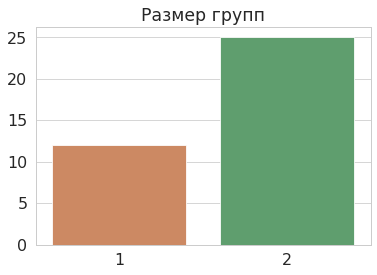

In [62]:
sns.barplot(data = [[0],[df_gt_only1day.ID.nunique()],[df_not1.ID.nunique()]])
plt.xlim(0.5)
plt.title('Размер групп');

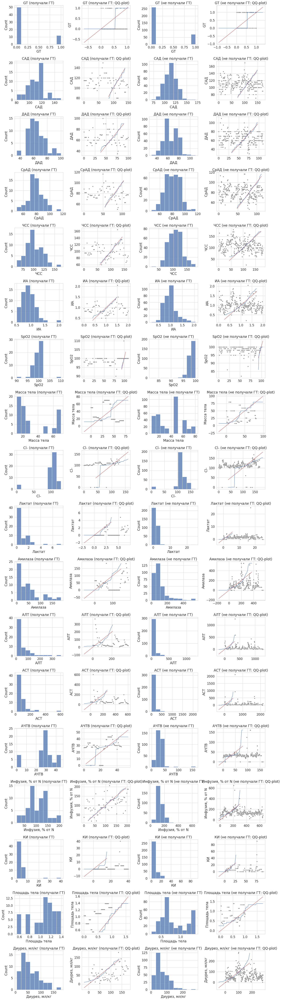

In [63]:
# for k,i in enumerate(target_columns[3:]):
#     print('Параметр =',i,'\nСреднее = ',df_gt_more1day[i].mean(),'std =',df_gt_more1day[i].std(ddof=1))
figure,ax = plt.subplots(len(target_columns[3:-1]),4,figsize=(19,70))
for k,i in enumerate(target_columns[3:-1]):
    try:
        sns.histplot(df_gt_only1day[i],bins=10,ax=ax[k,0])
        interval = np.linspace(0,1,int(df_gt_only1day[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(df_gt_only1day[i].count())),loc=df_gt_only1day[i].mean(),scale=df_gt_only1day[i].std(ddof=1))
        y = np.quantile(df_gt_only1day[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,1],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,1],color='b')
        sns.scatterplot(x = np.linspace(0,int(df_gt_only1day[i].max()),int(df_gt_only1day[i].count())),y = df_gt_only1day[i],ax=ax[k,1],color='grey')
        sns.histplot(df_not1[i],bins=10,ax=ax[k,2])
        interval = np.linspace(0,1,int(df_not1[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(df_not1[i].count())),loc=df_not1[i].mean(),scale=df_not1[i].std(ddof=1))
        y = np.quantile(df_not1[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,3],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,3],color='b')
        sns.scatterplot(x = np.linspace(0,int(df_not1[i].max()),int(df_not1[i].count())),y = df_not1[i],ax=ax[k,3],color='grey')
        ax[k,0].set_title(i+' (получали ГТ)')
        ax[k,1].set_title(i+' (получали ГТ: QQ-plot)')
        ax[k,2].set_title(i+' (не получали ГТ)')
        ax[k,3].set_title(i+' (не получали ГТ: QQ-plot)')
        plt.tight_layout()

    except Exception:
        ax[k,0].set_title(i+' (получали ГТ)')
        ax[k,1].set_title(i+' (получали ГТ: QQ-plot)')
        ax[k,2].set_title(i+' (не получали ГТ)')
        ax[k,3].set_title(i+' (не получали ГТ: QQ-plot)')
        plt.tight_layout()
        pass

In [64]:
for k,i in enumerate(target_columns[3:-1]):
    group0 = df_gt_only1day[i]
    group1 = df_not1[i]
    alpha = 0.05
    test_value, p  = stats.kruskal(group0,group1)
    if alpha<p:
        append_list.append(['Этап 3',i,'значимость различия не доказана',p,alpha])
    else:
        append_list.append(['Этап 3',i,'обнаружены значимые различия',p,alpha])
#     if alpha<p:
#         print(f'Разница по параметру {i} между двумя группами не доказана.')
#         print(f'\tСтатистика теста = {test_value}, p-значение = {p}')
#     else:
#         print(f'По параметру {i} наблюдается статистически достоверная разница между двумя группами.')
#         print(f'\tСтатистика теста = {test_value}, p-значение = {p}')

**результаты представлены в сводной таблице (см. ниже)**

### Этап 4
#### Пациенты делятся на 2 группы:
1. Получает гормонотерапию **только в первый день**
2. Не получает гормонотерапию за все время лечения

In [65]:
# df_gt_only1day - пациенты получают ГТ только в 1й день
df_only1 = df.loc[df.ID.isin(df_gt_only1day.ID.unique()),:]
# поле GT будет содержать 1, если пациент получал ГТ в какой-нибудь день
a = df.groupby('ID',as_index=False)['GT'].max()
users = a.loc[a['GT']==1,'ID'].values
df_noGT = df.loc[~df.ID.isin(users),:]

In [66]:
df_only1[target_columns[2:]].drop('GT',axis=1).describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,62.0,7.338710,3.922167,3.000000,4.000000,6.125000,11.750000,15.000000
САД,62.0,110.774194,13.216258,80.000000,102.750000,113.500000,118.750000,150.000000
ДАД,62.0,63.887097,12.420376,35.000000,55.000000,63.000000,70.000000,100.000000
СрАД,62.0,79.516129,11.562561,50.000000,73.083333,77.500000,85.750000,116.666667
ЧСС,62.0,101.145161,19.627554,60.000000,89.000000,98.500000,118.250000,165.000000
ИА,62.0,0.933377,0.257408,0.500000,0.780200,0.865385,1.065152,2.062500
SpO2,62.0,98.774194,2.321809,90.000000,98.000000,99.000000,100.000000,110.000000
Масса тела,62.0,32.741935,22.338627,12.000000,15.000000,21.500000,57.500000,70.000000
Cl-,62.0,100.972581,27.622521,0.000000,101.175000,106.100000,110.750000,129.000000
Лактат,62.0,0.732258,1.322538,0.000000,0.000000,0.000000,1.300000,7.400000


In [67]:
df_noGT[target_columns[2:]].drop('GT',axis=1).describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,442.0,9.533793,5.402981,0.250000,4.000000,11.000000,15.000000,18.000000
САД,442.0,110.757919,15.134701,50.000000,100.000000,110.000000,120.000000,170.000000
ДАД,442.0,64.291855,11.203473,26.000000,60.000000,64.500000,70.000000,119.000000
СрАД,442.0,79.780543,11.529464,34.000000,73.333333,80.000000,86.666667,117.333333
ЧСС,442.0,105.434389,23.485828,40.000000,90.000000,107.000000,120.000000,180.000000
ИА,442.0,0.977722,0.290774,0.381356,0.772942,0.989181,1.127008,2.250000
SpO2,442.0,98.490950,2.585703,70.000000,98.000000,99.000000,100.000000,100.000000
Масса тела,442.0,40.165158,23.323659,6.000000,16.500000,40.000000,60.000000,103.000000
Cl-,442.0,106.810633,27.240048,0.000000,103.225000,108.200000,113.925000,191.000000
Лактат,442.0,1.301787,1.358736,0.000000,0.000000,1.100000,1.700000,17.000000


In [68]:
# сравнение средних
a = pd.DataFrame(df_only1[target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: ГТ только в 1й день'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(df_noGT[df_noGT[i]>0][i].mean())
a['Группа 2: не получает ГТ'] = a_
a

,Группа 1: ГТ только в 1й день,Группа 2: не получает ГТ
Возраст,7.338710,9.533793
САД,110.774194,110.757919
ДАД,63.887097,64.291855
СрАД,79.516129,79.780543
ЧСС,101.145161,105.434389
ИА,0.933377,0.977722
SpO2,98.774194,98.490950
Масса тела,32.741935,40.165158
Cl-,100.972581,111.872749
Лактат,0.732258,1.743606


In [69]:
# Размер выборки
print(f'Количество пациентов в группах:\nПервая группа\t{df_only1.ID.nunique()}\nВторая группа\t{df_noGT.ID.nunique()}')

Количество пациентов в группах:
Первая группа	12
Вторая группа	90


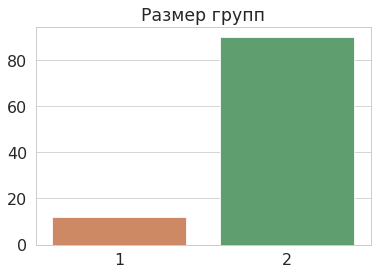

In [70]:
sns.barplot(data = [[0],[df_only1.ID.nunique()],[df_noGT.ID.nunique()]])
plt.xlim(0.5)
plt.title('Размер групп');

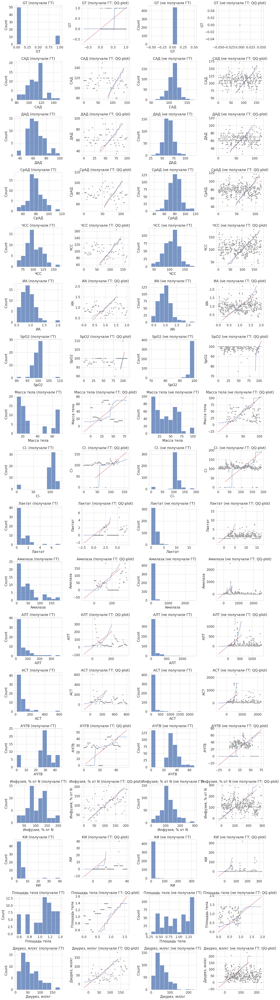

In [71]:
# for k,i in enumerate(target_columns[3:]):
#     print('Параметр =',i,'\nСреднее = ',df_gt_more1day[i].mean(),'std =',df_gt_more1day[i].std(ddof=1))
figure,ax = plt.subplots(len(target_columns[3:-1]),4,figsize=(19,70))
for k,i in enumerate(target_columns[3:-1]):
    try:
        sns.histplot(df_only1[i],bins=10,ax=ax[k,0])
        interval = np.linspace(0,1,int(df_only1[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(df_only1[i].count())),loc=df_only1[i].mean(),scale=df_only1[i].std(ddof=1))
        y = np.quantile(df_only1[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,1],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,1],color='b')
        sns.scatterplot(x = np.linspace(0,int(df_only1[i].max()),int(df_only1[i].count())),y = df_only1[i],ax=ax[k,1],color='grey')
        sns.histplot(df_noGT[i],bins=10,ax=ax[k,2])
        interval = np.linspace(0,1,int(df_noGT[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(df_noGT[i].count())),loc=df_noGT[i].mean(),scale=df_noGT[i].std(ddof=1))
        y = np.quantile(df_noGT[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,3],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,3],color='b')
        sns.scatterplot(x = np.linspace(0,int(df_noGT[i].max()),int(df_noGT[i].count())),y = df_noGT[i],ax=ax[k,3],color='grey')
        ax[k,0].set_title(i+' (получали ГТ)')
        ax[k,1].set_title(i+' (получали ГТ: QQ-plot)')
        ax[k,2].set_title(i+' (не получали ГТ)')
        ax[k,3].set_title(i+' (не получали ГТ: QQ-plot)')
        plt.tight_layout()

    except Exception:
        ax[k,0].set_title(i+' (получали ГТ)')
        ax[k,1].set_title(i+' (получали ГТ: QQ-plot)')
        ax[k,2].set_title(i+' (не получали ГТ)')
        ax[k,3].set_title(i+' (не получали ГТ: QQ-plot)')
        plt.tight_layout()
        pass

In [72]:
for k,i in enumerate(target_columns[3:-1]):
    group0 = df_only1[i]
    group1 = df_noGT[i]
    alpha = 0.05
    test_value, p  = stats.kruskal(group0,group1)
    if alpha<p:
        append_list.append(['Этап 4',i,'значимость различия не доказана',p,alpha])
    else:
        append_list.append(['Этап 4',i,'обнаружены значимые различия',p,alpha])
#     if alpha<p:
#         print(f'Разница по параметру {i} между двумя группами не доказана.')
#         print(f'\tСтатистика теста = {test_value}, p-значение = {p}')
#     else:
#         print(f'По параметру {i} наблюдается статистически достоверная разница между двумя группами.')
#         print(f'\tСтатистика теста = {test_value}, p-значение = {p}')

**результаты представлены в сводной таблице (см. ниже)**

### Этап 5
#### Пациенты делятся на 2 группы:

1. Получает гормонотерапию **в любой день**.
2. **Не получает** ни разу за время лечения.

**Ограничения: решение о назначении гормонотерапии (ГТ) определялось исходя из наличия показаний.**

#### Нулевая гипотеза: разницы между группами нет.

In [73]:
df_any_users = df.loc[df.GT==1,'ID'].unique()
df_any = df.loc[df.ID.isin(df_any_users),:]
df_noGT_users = df.groupby('ID',as_index=False).max()
df_noGT_users = df_noGT_users.loc[df_noGT_users.GT==0,'ID']
df_noGT = df.loc[df.ID.isin(df_noGT_users),:]

In [74]:
df_any[target_columns[2:]].drop('GT',axis=1).describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,950.0,10.169496,5.463123,0.250000,5.000000,12.000000,15.000000,17.000000
САД,950.0,111.498947,15.995175,45.000000,101.000000,110.000000,120.000000,170.000000
ДАД,950.0,65.114737,13.107262,5.000000,56.000000,65.000000,75.000000,110.000000
СрАД,950.0,80.576140,13.194491,26.333333,73.333333,80.833333,90.000000,120.666667
ЧСС,950.0,105.881053,23.499379,24.000000,90.000000,105.000000,120.000000,186.000000
ИА,950.0,0.974400,0.296070,0.200000,0.782609,0.926121,1.096178,3.100000
SpO2,950.0,98.324211,3.627861,26.000000,98.000000,99.000000,100.000000,110.000000
Масса тела,950.0,40.862105,22.366497,6.000000,20.000000,45.000000,60.000000,100.000000
Cl-,950.0,108.583579,43.823697,0.000000,104.000000,109.000000,116.000000,1102.000000
Лактат,950.0,1.544632,1.888258,-1.100000,0.700000,1.300000,2.000000,25.000000


In [75]:
df_noGT[target_columns[2:]].drop('GT',axis=1).describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,442.0,9.533793,5.402981,0.250000,4.000000,11.000000,15.000000,18.000000
САД,442.0,110.757919,15.134701,50.000000,100.000000,110.000000,120.000000,170.000000
ДАД,442.0,64.291855,11.203473,26.000000,60.000000,64.500000,70.000000,119.000000
СрАД,442.0,79.780543,11.529464,34.000000,73.333333,80.000000,86.666667,117.333333
ЧСС,442.0,105.434389,23.485828,40.000000,90.000000,107.000000,120.000000,180.000000
ИА,442.0,0.977722,0.290774,0.381356,0.772942,0.989181,1.127008,2.250000
SpO2,442.0,98.490950,2.585703,70.000000,98.000000,99.000000,100.000000,100.000000
Масса тела,442.0,40.165158,23.323659,6.000000,16.500000,40.000000,60.000000,103.000000
Cl-,442.0,106.810633,27.240048,0.000000,103.225000,108.200000,113.925000,191.000000
Лактат,442.0,1.301787,1.358736,0.000000,0.000000,1.100000,1.700000,17.000000


In [76]:
# сравнение средних
a = pd.DataFrame(df_any[target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: получает ГТ'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(df_noGT[df_noGT[i]>0][i].mean())
a['Группа 2: не получает ГТ'] = a_
a

,Группа 1: получает ГТ,Группа 2: не получает ГТ
Возраст,10.169496,9.533793
САД,111.498947,110.757919
ДАД,65.114737,64.291855
СрАД,80.576140,79.780543
ЧСС,105.881053,105.434389
ИА,0.974400,0.977722
SpO2,98.324211,98.490950
Масса тела,40.862105,40.165158
Cl-,108.583579,111.872749
Лактат,1.544632,1.743606


In [77]:
# Размер выборки
print(f'Количество пациентов в группах:\nПервая группа\t{df_any.ID.nunique()}\nВторая группа\t{df_noGT.ID.nunique()}')

Количество пациентов в группах:
Первая группа	113
Вторая группа	90


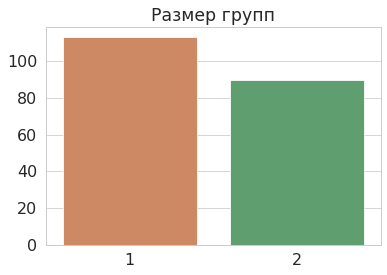

In [78]:
sns.barplot(data = [[0],[df_any.ID.nunique()],[df_noGT.ID.nunique()]])
plt.xlim(0.5)
plt.title('Размер групп');

#### Гистограммы значений и графики QQ-плот изучаемых параметров.

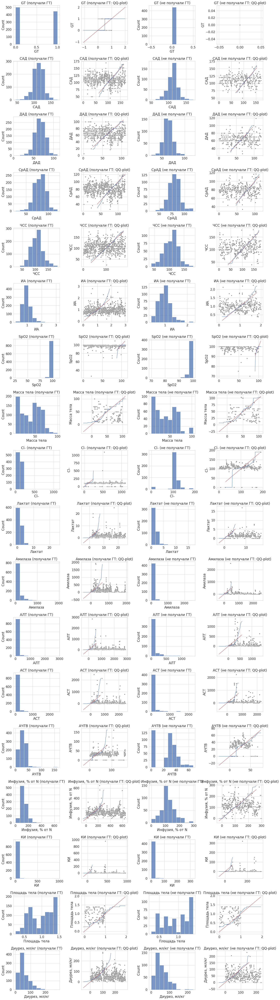

In [79]:
# for k,i in enumerate(target_columns[3:]):
#     print('Параметр =',i,'\nСреднее = ',df_gt_more1day[i].mean(),'std =',df_gt_more1day[i].std(ddof=1))
figure,ax = plt.subplots(len(target_columns[3:-1]),4,figsize=(19,70))
for k,i in enumerate(target_columns[3:-1]):
    try:
        sns.histplot(df_any[i],bins=10,ax=ax[k,0])
        interval = np.linspace(0,1,int(df_any[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(df_any[i].count())),loc=df_any[i].mean(),scale=df_any[i].std(ddof=1))
        y = np.quantile(df_any[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,1],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,1],color='b')
        sns.scatterplot(x = np.linspace(0,int(df_any[i].max()),int(df_any[i].count())),y = df_any[i],ax=ax[k,1],color='grey')
        sns.histplot(df_noGT[i],bins=10,ax=ax[k,2])
        interval = np.linspace(0,1,int(df_noGT[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(df_noGT[i].count())),loc=df_noGT[i].mean(),scale=df_noGT[i].std(ddof=1))
        y = np.quantile(df_noGT[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,3],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,3],color='b')
        sns.scatterplot(x = np.linspace(0,int(df_noGT[i].max()),int(df_noGT[i].count())),y = df_noGT[i],ax=ax[k,3],color='grey')
        ax[k,0].set_title(i+' (получали ГТ)')
        ax[k,1].set_title(i+' (получали ГТ: QQ-plot)')
        ax[k,2].set_title(i+' (не получали ГТ)')
        ax[k,3].set_title(i+' (не получали ГТ: QQ-plot)')
        plt.tight_layout()

    except Exception:
        ax[k,0].set_title(i+' (получали ГТ)')
        ax[k,1].set_title(i+' (получали ГТ: QQ-plot)')
        ax[k,2].set_title(i+' (не получали ГТ)')
        ax[k,3].set_title(i+' (не получали ГТ: QQ-plot)')
        plt.tight_layout()
        pass

* И снова на графиках QQ-плот отчетливо видно, что данные распределены непараметрически.
* Дальнейший анализ - с помощью критерия Краскела-Уоллиса

In [80]:
for k,i in enumerate(target_columns[3:-1]):
    group0 = df_any[i]
    group1 = df_noGT[i]
    alpha = 0.05
    test_value, p  = stats.kruskal(group0,group1)
    if alpha<p:
        append_list.append(['Этап 5',i,'значимость различия не доказана',p,alpha])
    else:
        append_list.append(['Этап 5',i,'обнаружены значимые различия',p,alpha])
    if alpha<p:
        print(f'Разница по параметру {i} между двумя группами не доказана.')
        print(f'\tСтатистика теста = {test_value}, p-значение = {p}')
    else:
        print(f'По параметру {i} наблюдается статистически достоверная разница между двумя группами.')
        print(f'\tСтатистика теста = {test_value}, p-значение = {p}')

По параметру GT наблюдается статистически достоверная разница между двумя группами.
	Статистика теста = 308.14877267399817, p-значение = 5.527209682796086e-69
Разница по параметру САД между двумя группами не доказана.
	Статистика теста = 0.789104211346105, p-значение = 0.3743711298061947
Разница по параметру ДАД между двумя группами не доказана.
	Статистика теста = 2.7054287237733887, p-значение = 0.10000719410523369
Разница по параметру СрАД между двумя группами не доказана.
	Статистика теста = 3.0993025343491, p-значение = 0.07832584439605056
Разница по параметру ЧСС между двумя группами не доказана.
	Статистика теста = 0.11643911886382965, p-значение = 0.7329291102177846
Разница по параметру ИА между двумя группами не доказана.
	Статистика теста = 1.6827012673646609, p-значение = 0.1945659039824976
Разница по параметру SpO2 между двумя группами не доказана.
	Статистика теста = 1.4013909315768618, p-значение = 0.23649082215979317
Разница по параметру Масса тела между двумя группами н

* В результате была обнаружена статистически достоверная разница между группами по параметру Амилаза и КИ.
* По параметру КИ обращает на себя внимание один выброс в группе, получавшей ГТ (см. график). Рассчитаем статистику без него.

In [81]:
group0 = df_any['КИ'].drop(df_any.loc[df_any['КИ']>800,:].index,axis=0)
group1 = df_noGT['КИ']
alpha = 0.05
test_value, p  = stats.kruskal(group0,group1)
if alpha<p:
    print(f'Разница по параметру КИ между двумя группами не доказана.')
    print(f'\tСтатистика теста = {test_value}, p-значение = {p}')
else:
    print(f'По параметру КИ наблюдается статистически достоверная разница между двумя группами.')
    print(f'\tСтатистика теста = {test_value}, p-значение = {p}')

По параметру КИ наблюдается статистически достоверная разница между двумя группами.
	Статистика теста = 44.23698594591091, p-значение = 2.909321225967024e-11


* Даже после устранения этого выброса сохраняется значимость различий между группами.
* Различия по КИ и амилазе могут свидетельствовать о тяжести состояния данных пациентов. В то время как параметры гемодинамики могут быть скорректированы гормональной поддержкой преднизолоном, дексаметазоном, инотропными препаратами и волемической нагрузкой, становится необходимым использовать индексы и биохимические маркеры повреждения органов для оценки состояния и прогноза заболевания.

In [82]:
def highlight_greaterthan(x):
    color = 'lightgreen' if x<0.05 else 'white'
    return 'background-color: %s' % color
df_results = pd.DataFrame(append_list)
df_results.columns = columns
df_results = df_results.drop(['Значимость различий','alpha'], axis=1).pivot(columns = 'Вариант',index = 'Показатель',values = 'p_value').drop('GT',axis=0)
df_results = df_results.style.applymap(highlight_greaterthan)
df_results

Вариант,Этап 1,Этап 2,Этап 3,Этап 4,Этап 5
Показатель,,,,,
Cl-,0.457506,0.097884,0.000003,0.033847,0.159764
SpO2,0.752932,0.487279,0.628304,0.909820,0.236491
АЛТ,0.975858,0.058156,0.179017,0.490306,0.304157
АСТ,0.505087,0.796281,0.045298,0.460869,0.616559
АЧТВ,0.437916,0.046088,0.010146,0.885253,0.571875
Амилаза,0.172694,0.021492,0.000000,0.198576,0.000001
ДАД,0.291620,0.124629,0.421296,0.500656,0.100007
"Диурез, мл/кг",0.423433,0.047508,0.137048,0.900328,0.130595
ИА,0.413728,0.506601,0.086575,0.155302,0.194566


---

## Анализ выживаемости при использовании ГТ

#### Пациенты делятся на 2 группы:

1. Выжившие.
2. Умершие.

**По этим двум группам отдельно сравниваются пациенты получавшие и не получавшие ГТ**

**Ограничения: решение о назначении гормонотерапии (ГТ) определялось исходя из наличия показаний.**

#### Нулевая гипотеза: разницы между группами нет.

#### Графический анализ
* графики распределения значений параметров 2х групп пациентов (выживших и умерших): все дни лечения

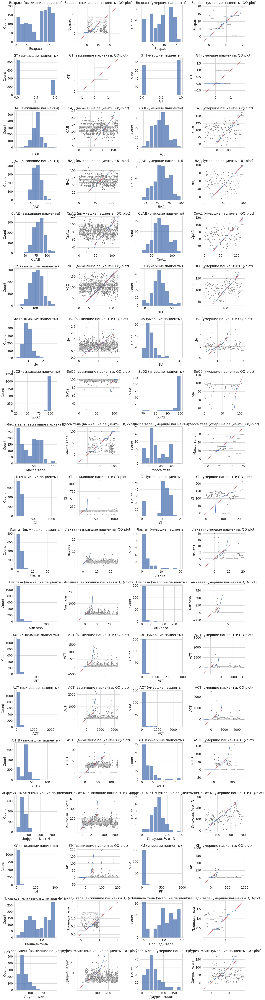

In [83]:
group0 = df[df['OUTCOME']=='Survived']
group1 = df[df['OUTCOME']=='Died']
figure,ax = plt.subplots(len(target_columns[2:-1]),4,figsize=(19,75))
for k,i in enumerate(target_columns[2:-1]):
    try:
        sns.histplot(group0[i],bins=10,ax=ax[k,0])
        interval = np.linspace(0,1,int(group0[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(group0[i].count())),loc=group0[i].mean(),scale=group0[i].std(ddof=1))
        y = np.quantile(group0[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,1],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,1],color='b')
        sns.scatterplot(x = np.linspace(0,int(group0[i].max()),int(group0[i].count())),y = group0[i],ax=ax[k,1],color='grey')
        sns.histplot(group1[i],bins=10,ax=ax[k,2])
        interval = np.linspace(0,1,int(group1[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(group1[i].count())),loc=group1[i].mean(),scale=group1[i].std(ddof=1))
        y = np.quantile(group1[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,3],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,3],color='b')
        sns.scatterplot(x = np.linspace(0,int(group1[i].max()),int(group1[i].count())),y = group1[i],ax=ax[k,3],color='grey')
        ax[k,0].set_title(i+' (выжившие пациенты)')
        ax[k,1].set_title(i+' (выжившие пациенты: QQ-plot)')
        ax[k,2].set_title(i+' (умершие пациенты)')
        ax[k,3].set_title(i+' (умершие пациенты: QQ-plot)')
        plt.tight_layout()

    except Exception:
        ax[k,0].set_title(i+' (выжившие пациенты)')
        ax[k,1].set_title(i+' (выжившие пациенты: QQ-plot)')
        ax[k,2].set_title(i+' (умершие пациенты)')
        ax[k,3].set_title(i+' (умершие пациенты: QQ-plot)')
        plt.tight_layout()
        pass

1. **Все вместе**:

    - получавшие ГТ;
    - не получавшие ГТ.

In [84]:
df.groupby('OUTCOME',as_index=False)['ID'].nunique().replace({'Died':'Умерли','Survived':'Выжили'})

,OUTCOME,ID
0,Умерли,19
1,Выжили,184


**Имеется сильная асимметрия выборки: большинство пациентов выжили; 19 - умерли.**

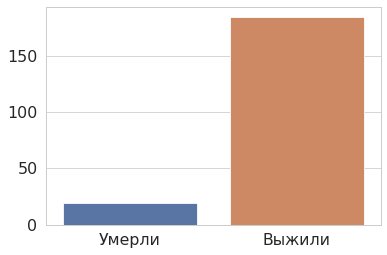

In [85]:
# количество умерших (Died) и выживших (Survived) пациентов
fig, ax = plt.subplots()
sns.barplot(data = [[i] for i in df.groupby('OUTCOME',as_index=False)['ID'].nunique()['ID']])
ax.set_xticklabels(['Умерли', 'Выжили'])
plt.show()

Описательная статистика: **Выжившие пациенты**

In [86]:
# описательная статистика выживших пациентов
df[df['OUTCOME']=='Survived'][target_columns[2:-1]].describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,1232.0,10.154795,5.538551,0.25,4.000000,12.000000,15.000000,18.000000
GT,1232.0,0.293831,0.455701,0.00,0.000000,0.000000,1.000000,1.000000
САД,1232.0,112.331981,14.082478,50.00,104.000000,110.000000,120.000000,170.000000
ДАД,1232.0,65.692370,11.614174,5.00,60.000000,65.000000,73.000000,119.000000
СрАД,1232.0,81.238907,11.469878,30.00,73.333333,81.333333,88.333333,117.666667
ЧСС,1232.0,105.797890,23.279370,24.00,90.000000,106.000000,120.000000,180.000000
ИА,1232.0,0.962915,0.278175,0.20,0.772727,0.933333,1.100000,2.800000
SpO2,1232.0,98.581169,2.996055,26.00,98.000000,99.000000,100.000000,110.000000
Масса тела,1232.0,41.689123,23.182670,6.00,18.000000,45.000000,60.000000,103.000000
Cl-,1232.0,108.456494,38.399841,0.00,103.875000,108.000000,114.000000,1102.000000


Описательная статистика: **Умершие пациенты**

In [87]:
# описательная статистика умерших пациентов
df[df['OUTCOME']=='Died'][target_columns[2:-1]].describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,160.0,8.526563,4.473692,0.250000,5.250000,9.000000,13.000000,17.000000
GT,160.0,0.543750,0.499646,0.000000,0.000000,1.000000,1.000000,1.000000
САД,160.0,103.037500,23.474565,45.000000,86.500000,103.000000,117.000000,165.000000
ДАД,160.0,58.393750,16.823949,17.000000,46.750000,59.500000,70.000000,99.000000
СрАД,160.0,73.275000,18.274426,26.333333,60.000000,73.333333,86.833333,120.666667
ЧСС,160.0,105.287500,25.105410,41.000000,90.000000,106.000000,121.250000,186.000000
ИА,160.0,1.072014,0.384730,0.464000,0.838539,0.990990,1.191877,3.100000
SpO2,160.0,96.806250,4.984879,69.000000,98.000000,98.000000,99.000000,100.000000
Масса тела,160.0,32.568750,16.142300,6.000000,20.000000,30.000000,43.000000,75.000000
Cl-,160.0,104.664375,45.801353,0.000000,103.125000,114.500000,133.250000,193.000000


In [88]:
# сравнение средних
a = pd.DataFrame(df[df['OUTCOME']=='Died'][target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: умерли'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(df[df['OUTCOME']=='Survived'][i].mean())
a['Группа 2: выжили'] = a_
a

,Группа 1: умерли,Группа 2: выжили
Возраст,8.526563,10.154795
САД,103.037500,112.331981
ДАД,58.393750,65.692370
СрАД,73.275000,81.238907
ЧСС,105.287500,105.797890
ИА,1.072014,0.962915
SpO2,96.806250,98.581169
Масса тела,32.568750,41.689123
Cl-,104.664375,108.456494
Лактат,2.181563,1.374789


**Проверка наличия значимой разницы между группами выживших и умерших пациентов**

In [89]:
# для сохранения результатов в виде таблицы
columns = ['Вариант','Показатель','Значимость различий','p_value','alpha']
append_list = []
# т.к. выборки разного размера, в одной из них - мало данных, распределение не нормальное (графики ниже), воспользуемся тестом Краскела-Уоллиса
for k,i in enumerate(target_columns[2:-1]):
    group0 = df[df['OUTCOME']=='Survived'][i]
    group1 = df[df['OUTCOME']=='Died'][i]
    alpha = 0.05
    test_value, p  = stats.kruskal(group0,group1)
    if alpha<p:
        append_list.append(['Все пациенты',i,'значимость различия не доказана',p,alpha])
    else:
        append_list.append(['Все пациенты',i,'обнаружены значимые различия',p,alpha])

2. **Пациенты, получавшие ГТ**

In [90]:
a = df[df['GT']==1].groupby('OUTCOME',as_index=False)['ID'].nunique().replace({'Died':'Умерли','Survived':'Выжили'})
a.columns=['Исход','Количество пациентов']
a

,Исход,Количество пациентов
0,Умерли,14
1,Выжили,99


In [91]:
# Группа 1: умерли
df[(df['OUTCOME']=='Died')&(df['GT']==1)][target_columns[2:-1]].describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,87.0,7.028736,3.970190,0.250000,4.833333,6.666667,9.000000,17.000000
GT,87.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
САД,87.0,99.160920,21.265691,45.000000,82.500000,102.000000,114.000000,165.000000
ДАД,87.0,57.034483,16.770994,17.000000,45.000000,58.000000,70.000000,93.000000
СрАД,87.0,71.076628,17.668692,26.333333,59.666667,71.666667,84.833333,115.000000
ЧСС,87.0,104.321839,28.342381,41.000000,87.000000,107.000000,121.500000,186.000000
ИА,87.0,1.095675,0.420074,0.464000,0.858396,1.000000,1.192099,3.100000
SpO2,87.0,97.091954,4.105108,70.000000,97.500000,98.000000,99.000000,100.000000
Масса тела,87.0,27.137931,13.913497,6.000000,20.000000,25.000000,30.000000,75.000000
Cl-,87.0,109.483908,45.386889,0.000000,103.500000,120.000000,139.000000,193.000000


In [92]:
# Группа 2: выжили
df[(df['OUTCOME']=='Survived')&(df['GT']==1)][target_columns[2:-1]].describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,362.0,9.588113,5.599449,0.666667,4.000000,11.000000,14.000000,17.000000
GT,362.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
САД,362.0,110.812155,15.094827,50.000000,100.000000,110.000000,120.000000,163.000000
ДАД,362.0,63.944751,12.661248,20.000000,55.000000,64.000000,70.000000,100.000000
СрАД,362.0,79.567219,12.645701,30.000000,71.416667,79.333333,87.333333,117.666667
ЧСС,362.0,106.569061,24.055843,52.000000,90.000000,106.000000,120.000000,176.000000
ИА,362.0,0.991421,0.320478,0.412903,0.782143,0.936364,1.116447,2.800000
SpO2,362.0,98.345304,4.565266,26.000000,98.000000,99.000000,100.000000,100.000000
Масса тела,362.0,39.592541,23.571319,7.500000,17.000000,35.000000,60.000000,100.000000
Cl-,362.0,108.098066,63.417005,0.000000,104.000000,109.000000,115.000000,1102.000000


In [93]:
# сравнение средних
a = pd.DataFrame(df[(df['OUTCOME']=='Died')&(df['GT']==1)][target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: умерли'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(df[(df['OUTCOME']=='Survived')&(df['GT']==1)][i].mean())
a['Группа 2: выжили'] = a_
a

,Группа 1: умерли,Группа 2: выжили
Возраст,7.028736,9.588113
САД,99.160920,110.812155
ДАД,57.034483,63.944751
СрАД,71.076628,79.567219
ЧСС,104.321839,106.569061
ИА,1.095675,0.991421
SpO2,97.091954,98.345304
Масса тела,27.137931,39.592541
Cl-,109.483908,108.098066
Лактат,2.839655,1.633287


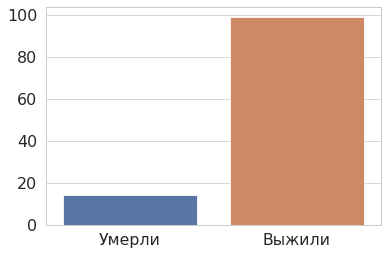

In [94]:
# количество умерших (0) и выживших (1) пациентов, получавших ГТ
fig, ax = plt.subplots()
sns.barplot(data = [[i] for i in df[df['GT']==1].groupby('ID')['OUTCOME'].first().value_counts()[::-1]]);
ax.set_xticklabels(['Умерли', 'Выжили'])
plt.show()

**Проверка наличия значимой разницы между группами выживших и умерших пациентов, получавших ГТ**

In [95]:
# т.к. выборки разного размера, в одной из них - мало данных, распределение не нормальное (графики ниже), воспользуемся тестом Краскела-Уоллиса
for k,i in enumerate(target_columns[2:-1]):
    group0 = df[(df['OUTCOME']=='Survived')&(df['GT']==1)][i]
    group1 = df[(df['OUTCOME']=='Died')&(df['GT']==1)][i]
    alpha = 0.05
    try:        
        test_value, p  = stats.kruskal(group0,group1)
        if alpha<p:
            append_list.append(['Получали ГТ',i,'значимость различия не доказана',p,alpha])
        else:
            append_list.append(['Получали ГТ',i,'обнаружены значимые различия',p,alpha])
    except Exception:
        pass

3. **Пациенты, не получавшие ГТ**

In [96]:
gt_users = df.loc[df['GT']==1,'ID'].unique()
a = df[(df['GT']==0)&(~df.ID.isin(gt_users))].groupby('OUTCOME',as_index=False)['ID'].nunique().replace({'Died':'Умерли','Survived':'Выжили'})
a.columns=['Исход','Количество пациентов']
a

,Исход,Количество пациентов
0,Умерли,5
1,Выжили,85


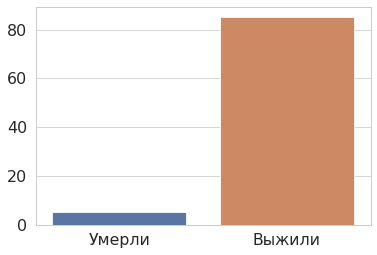

In [97]:
# количество умерших (0) и выживших (1) пациентов, не получавших ГТ
fig, ax = plt.subplots()
sns.barplot(data = [[i] for i in df[(df['GT']==0)&(~df.ID.isin(gt_users))].groupby('ID')['OUTCOME'].first().value_counts()[::-1]]);
ax.set_xticklabels(['Умерли', 'Выжили'])
plt.show()

In [98]:
# Группа 1: умерли
df[(df['OUTCOME']=='Died')&(df['GT']==0)&(~df.ID.isin(gt_users))][target_columns[2:-1]].describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,28.0,10.000000,5.429685,1.000000,9.250000,12.000000,13.000000,17.000000
GT,28.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
САД,28.0,98.035714,22.280172,50.000000,85.000000,93.000000,111.500000,142.000000
ДАД,28.0,55.250000,16.249501,26.000000,44.500000,52.000000,62.000000,96.000000
СрАД,28.0,69.511905,17.695058,34.000000,58.000000,66.666667,77.666667,110.666667
ЧСС,28.0,115.964286,22.701741,64.000000,101.500000,117.000000,125.750000,178.000000
ИА,28.0,1.236859,0.355690,0.731707,0.981818,1.183473,1.361928,2.200000
SpO2,28.0,97.071429,5.401842,75.000000,98.000000,99.000000,99.250000,100.000000
Масса тела,28.0,40.000000,17.747196,12.000000,33.000000,40.000000,56.000000,56.000000
Cl-,28.0,101.810714,49.739293,0.000000,108.000000,116.000000,132.000000,141.000000


In [99]:
# Группа 2: выжили
df[(df['OUTCOME']=='Survived')&(df['GT']==0)&(~df.ID.isin(gt_users))][target_columns[2:-1]].describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,414.0,9.502262,5.406316,0.250000,4.000000,11.000000,15.000000,18.000000
GT,414.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
САД,414.0,111.618357,14.156998,70.000000,102.000000,110.000000,120.000000,170.000000
ДАД,414.0,64.903382,10.528427,30.000000,60.000000,65.000000,70.000000,119.000000
СрАД,414.0,80.475040,10.669506,43.333333,73.333333,80.000000,86.666667,117.333333
ЧСС,414.0,104.722222,23.393624,40.000000,90.000000,105.000000,120.000000,180.000000
ИА,414.0,0.960196,0.277759,0.381356,0.765913,0.973903,1.110561,2.250000
SpO2,414.0,98.586957,2.255136,70.000000,98.000000,99.000000,100.000000,100.000000
Масса тела,414.0,40.176329,23.670259,6.000000,16.500000,37.000000,60.000000,103.000000
Cl-,414.0,107.148792,25.075463,0.000000,103.200000,108.000000,113.000000,191.000000


In [100]:
# сравнение средних
a = pd.DataFrame(df[(df['OUTCOME']=='Died')&(df['GT']==0)&(~df.ID.isin(gt_users))][target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: умерли'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(df[(df['OUTCOME']=='Survived')&(df['GT']==0)&(~df.ID.isin(gt_users))][i].mean())
a['Группа 2: выжили'] = a_
a

,Группа 1: умерли,Группа 2: выжили
Возраст,10.000000,9.502262
САД,98.035714,111.618357
ДАД,55.250000,64.903382
СрАД,69.511905,80.475040
ЧСС,115.964286,104.722222
ИА,1.236859,0.960196
SpO2,97.071429,98.586957
Масса тела,40.000000,40.176329
Cl-,101.810714,107.148792
Лактат,1.942857,1.258430


**Проверка наличия значимой разницы между группами выживших и умерших пациентов, неполучавших ГТ**

In [101]:
# т.к. выборки разного размера, в одной из них - мало данных, распределение не нормальное, воспользуемся тестом Краскела-Уоллиса
for k,i in enumerate(target_columns[2:-1]):
    group0 = df[(df['OUTCOME']=='Survived')&(df['GT']==0)][i]
    group1 = df[(df['OUTCOME']=='Died')&(df['GT']==0)][i]
    alpha = 0.05
    try:        
        test_value, p  = stats.kruskal(group0,group1)
        if alpha<p:
            append_list.append(['Не получали ГТ',i,'значимость различия не доказана',p,alpha])
        else:
            append_list.append(['Не получали ГТ',i,'обнаружены значимые различия',p,alpha])
    except Exception:
        pass

## 1й день

1. **Все вместе**
2. **Получавшие ГТ**
3. **Неполучавшие ГТ**

#### При анализе первого дня количество анализируемых пациентов не изменяется (все находились в ОРИТ хотя бы 1 день)

1

In [102]:
# т.к. выборки разного размера, в одной из них - мало данных, распределение не нормальное, воспользуемся тестом Краскела-Уоллиса
for k,i in enumerate(target_columns[2:-1]):
    group0 = df[(df['OUTCOME']=='Survived')&(df.Day==1)][i]
    group1 = df[(df['OUTCOME']=='Died')&(df.Day==1)][i]
    alpha = 0.05
    test_value, p  = stats.kruskal(group0,group1)
    if alpha<p:
        append_list.append(['Все пациенты, 1й день',i,'значимость различия не доказана',p,alpha])
    else:
        append_list.append(['Все пациенты, 1й день',i,'обнаружены значимые различия',p,alpha])
print(f'Выживших: {group0.shape[0]}, умерших: {group1.shape[0]}')

Выживших: 184, умерших: 19


In [103]:
a0 = df[(df['OUTCOME']=='Survived')&(df.Day==1)]
df[(df['OUTCOME']=='Survived')&(df.Day==1)].describe().T

,count,mean,std,min,25%,50%,75%,max
ID,184.0,105.146739,63.918025,1.000000,47.750000,107.500000,157.500000,216.000000
Day,184.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Возраст,184.0,8.988207,5.359763,0.250000,4.000000,8.500000,14.000000,18.000000
GT,184.0,0.407609,0.492730,0.000000,0.000000,0.000000,1.000000,1.000000
САД,184.0,107.000000,18.267592,50.000000,94.750000,110.000000,120.000000,159.000000
ДАД,184.0,63.179348,13.639600,20.000000,55.000000,60.000000,70.000000,119.000000
СрАД,184.0,77.786232,14.272743,30.000000,69.083333,78.000000,86.666667,117.333333
ЧСС,184.0,110.809783,22.699551,40.000000,94.000000,110.000000,124.000000,172.000000
ИА,184.0,1.081798,0.365621,0.407692,0.828591,1.038462,1.224465,2.800000
SpO2,184.0,98.173913,6.102241,26.000000,98.000000,100.000000,100.000000,100.000000


In [104]:
b0 = df[(df['OUTCOME']=='Died')&(df.Day==1)]
df[(df['OUTCOME']=='Died')&(df.Day==1)].describe().T

,count,mean,std,min,25%,50%,75%,max
ID,19.0,94.263158,35.529084,30.000000,78.500000,91.000000,95.500000,205.000000
Day,19.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Возраст,19.0,9.342105,5.659097,0.250000,5.125000,9.000000,14.000000,17.000000
GT,19.0,0.684211,0.477567,0.000000,0.000000,1.000000,1.000000,1.000000
САД,19.0,93.526316,24.541050,45.000000,72.500000,99.000000,111.000000,130.000000
ДАД,19.0,51.631579,18.294536,17.000000,40.000000,53.000000,65.000000,81.000000
СрАД,19.0,65.596491,19.754849,26.333333,49.166667,68.333333,80.166667,95.666667
ЧСС,19.0,108.421053,30.229338,54.000000,88.000000,110.000000,133.500000,160.000000
ИА,19.0,1.220780,0.421409,0.464000,0.970702,1.173333,1.443137,2.285714
SpO2,19.0,94.473684,8.585313,70.000000,94.500000,98.000000,99.000000,100.000000


In [105]:
# сравнение средних
a = pd.DataFrame(b0[(b0['OUTCOME']=='Died')&(b0['Day']==1)][target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: умерли'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(a0[(a0['OUTCOME']=='Survived')&(a0['Day']==1)][i].mean())
a['Группа 2: выжили'] = a_
a

,Группа 1: умерли,Группа 2: выжили
Возраст,9.342105,8.988207
САД,93.526316,107.000000
ДАД,51.631579,63.179348
СрАД,65.596491,77.786232
ЧСС,108.421053,110.809783
ИА,1.220780,1.081798
SpO2,94.473684,98.173913
Масса тела,35.631579,36.005435
Cl-,95.789474,93.267391
Лактат,3.684211,1.627717


Возраст


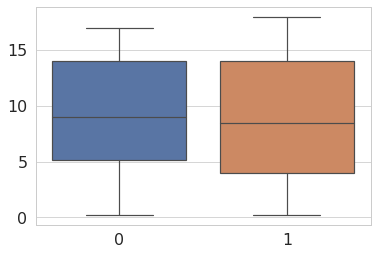

САД


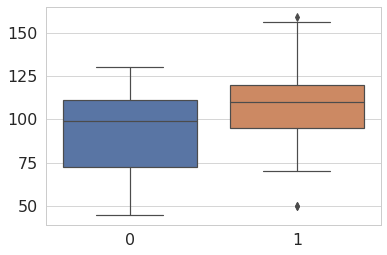

ДАД


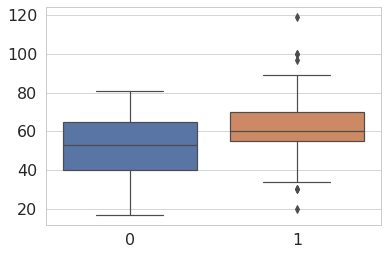

СрАД


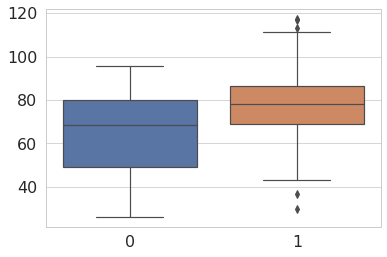

ЧСС


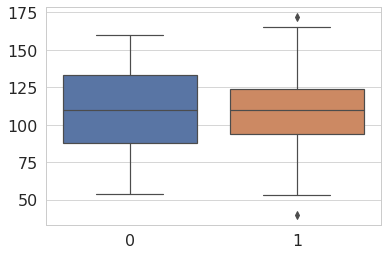

ИА


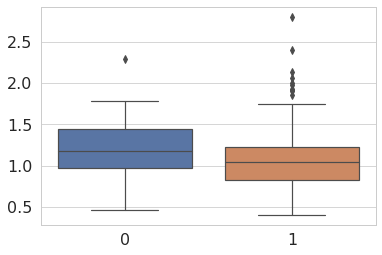

SpO2


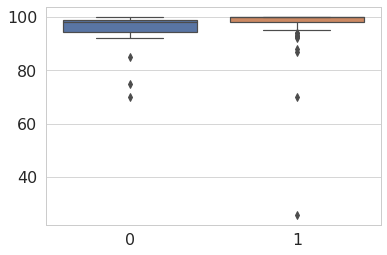

Масса тела


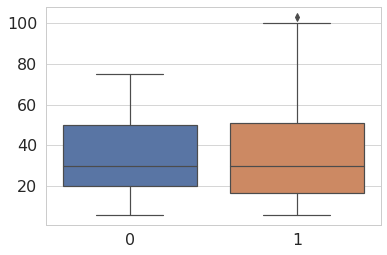

Cl-


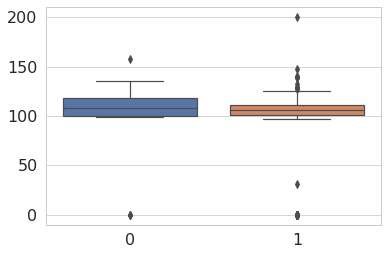

Лактат


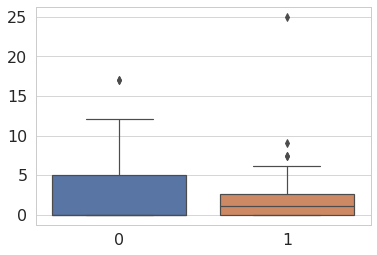

Амилаза


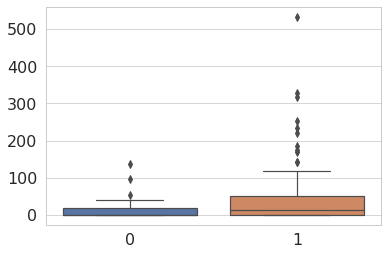

АЛТ


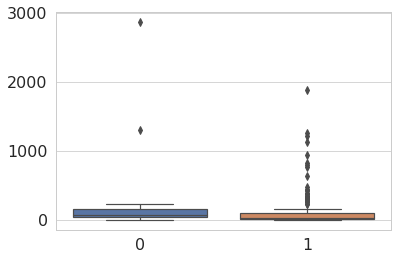

АСТ


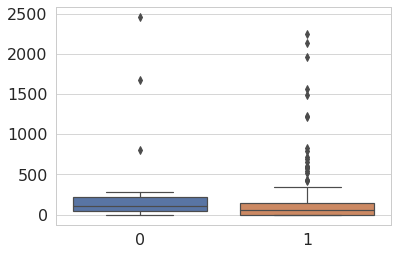

АЧТВ


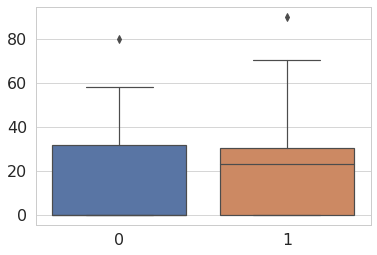

Инфузия, % от N


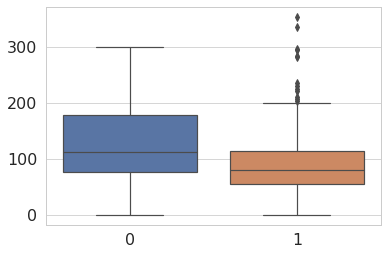

КИ


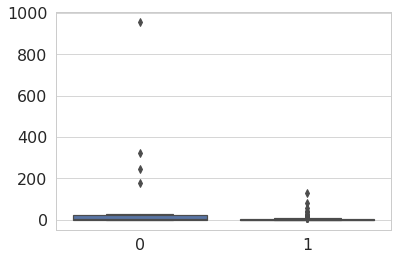

Площадь тела


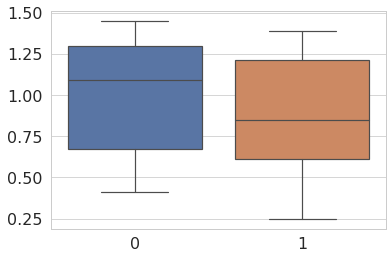

Диурез, мл/кг


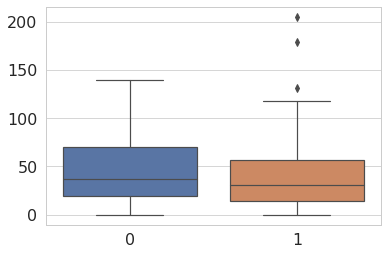

In [106]:
for i in a0.columns[2:-1]:
    if i!='GT':
        print(i)
        sns.boxplot(data = [b0[i],a0[i]]);
        plt.show()

2

In [107]:
# т.к. выборки разного размера, в одной из них - мало данных, распределение не нормальное, воспользуемся тестом Краскела-Уоллиса
for k,i in enumerate(target_columns[2:-1]):
    group0 = df[(df['OUTCOME']=='Survived')&(df.Day==1)&(df.GT==1)][i]
    group1 = df[(df['OUTCOME']=='Died')&(df.Day==1)&(df.GT==1)][i]
    alpha = 0.05
    try:
        test_value, p  = stats.kruskal(group0,group1)
        if alpha<p:
            append_list.append(['Получали ГТ, 1й день',i,'значимость различия не доказана',p,alpha])
        else:
            append_list.append(['Получали ГТ, 1й день',i,'обнаружены значимые различия',p,alpha])
    except Exception:
        pass
print(f'Выживших, получавших ГТ: {group0.shape[0]}, умерших, получавших ГТ: {group1.shape[0]}')

Выживших, получавших ГТ: 75, умерших, получавших ГТ: 13


In [108]:
a1 = df[(df['OUTCOME']=='Survived')&(df.Day==1)&(df.GT==1)]
a1.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,75.0,108.093333,67.853812,3.000000,39.500000,116.000000,174.500000,215.000000
Day,75.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Возраст,75.0,8.862222,5.144140,0.666667,4.000000,9.000000,13.000000,17.000000
GT,75.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
САД,75.0,107.160000,19.811299,50.000000,95.000000,108.000000,119.000000,155.000000
ДАД,75.0,62.013333,14.497431,20.000000,51.000000,62.000000,70.000000,100.000000
СрАД,75.0,77.062222,15.414366,30.000000,68.000000,78.000000,87.500000,113.333333
ЧСС,75.0,113.226667,22.916165,62.000000,98.000000,115.000000,122.000000,172.000000
ИА,75.0,1.118873,0.420857,0.412903,0.854497,1.076190,1.267943,2.800000
SpO2,75.0,97.733333,8.679478,26.000000,98.000000,100.000000,100.000000,100.000000


In [109]:
b1 = df[(df['OUTCOME']=='Died')&(df.Day==1)&(df.GT==1)]
b1.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,13.0,96.461538,40.879121,30.000000,80.000000,91.000000,96.000000,205.000000
Day,13.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Возраст,13.0,8.423077,5.449416,0.250000,5.000000,6.666667,14.000000,17.000000
GT,13.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
САД,13.0,91.153846,26.635960,45.000000,70.000000,90.000000,110.000000,130.000000
ДАД,13.0,48.615385,18.768495,17.000000,30.000000,52.000000,65.000000,78.000000
СрАД,13.0,62.794872,20.595099,26.333333,46.666667,68.333333,80.000000,93.000000
ЧСС,13.0,101.307692,31.784128,54.000000,80.000000,100.000000,120.000000,160.000000
ИА,13.0,1.181043,0.447806,0.464000,0.950495,1.173333,1.333333,2.285714
SpO2,13.0,94.615385,8.539501,70.000000,93.000000,99.000000,99.000000,100.000000


In [110]:
# сравнение средних
a = pd.DataFrame(b1[(b1['OUTCOME']=='Died')&(b1['GT']==1)][target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: умерли'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(a1[(a1['OUTCOME']=='Survived')&(a1['GT']==1)][i].mean())
a['Группа 2: выжили'] = a_
a

,Группа 1: умерли,Группа 2: выжили
Возраст,8.423077,8.862222
САД,91.153846,107.160000
ДАД,48.615385,62.013333
СрАД,62.794872,77.062222
ЧСС,101.307692,113.226667
ИА,1.181043,1.118873
SpO2,94.615385,97.733333
Масса тела,34.076923,36.473333
Cl-,96.076923,89.880000
Лактат,3.500000,1.688000


Возраст


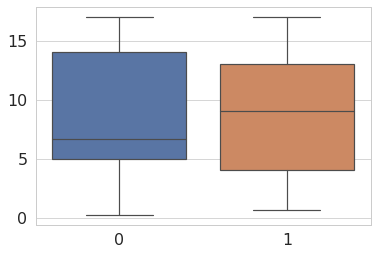

САД


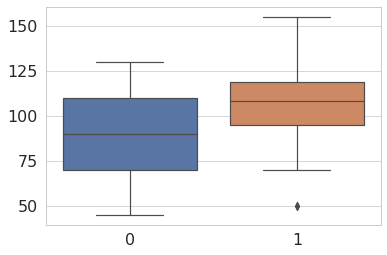

ДАД


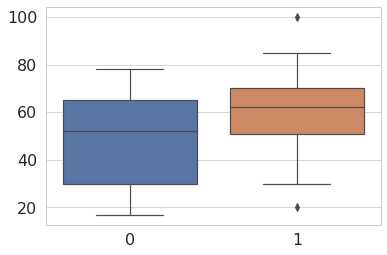

СрАД


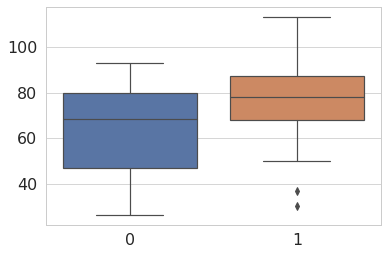

ЧСС


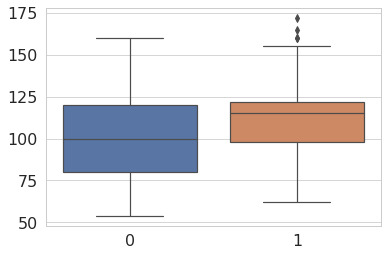

ИА


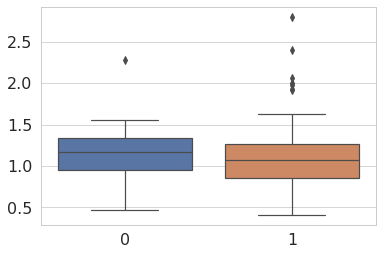

SpO2


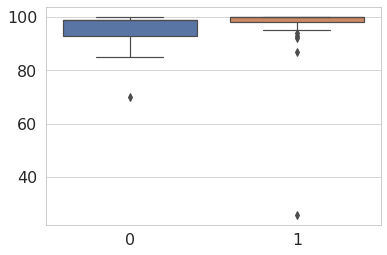

Масса тела


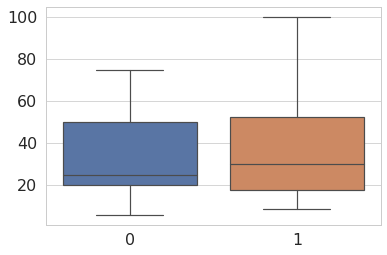

Cl-


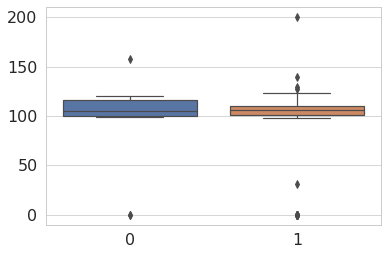

Лактат


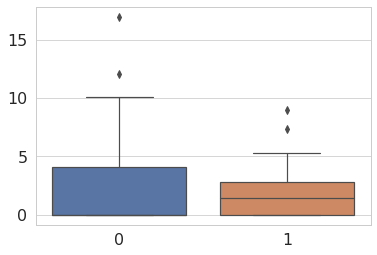

Амилаза


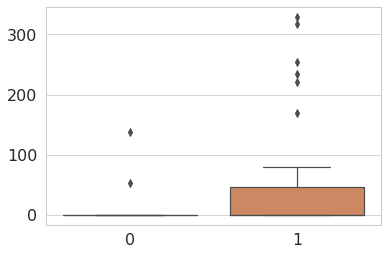

АЛТ


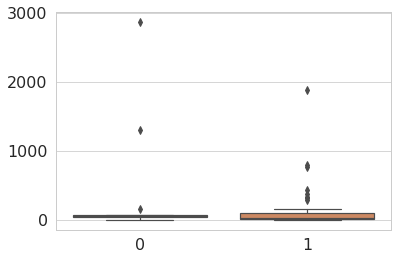

АСТ


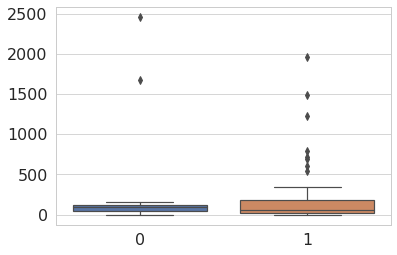

АЧТВ


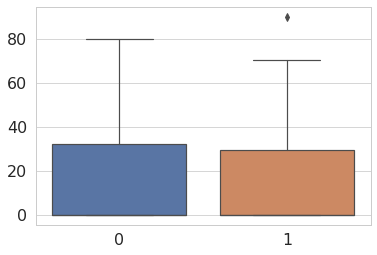

Инфузия, % от N


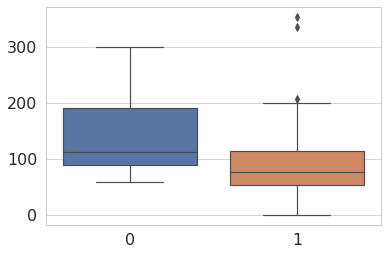

КИ


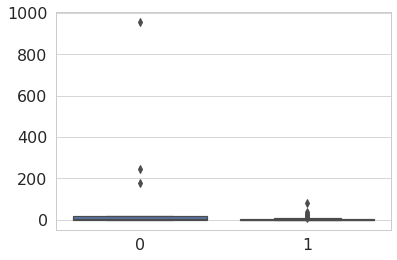

Площадь тела


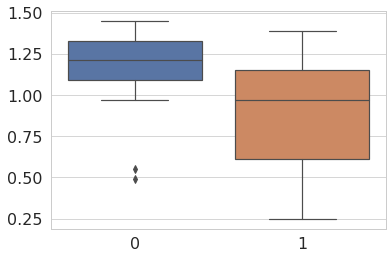

Диурез, мл/кг


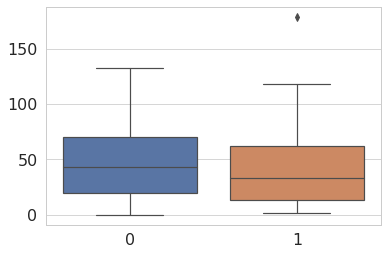

In [111]:
for i in a1.columns[2:-1]:
    if i!='GT':
        print(i)
        sns.boxplot(data = [b1[i],a1[i]]);
        plt.show()

3

In [112]:
# т.к. выборки разного размера, в одной из них - мало данных, распределение не нормальное, воспользуемся тестом Краскела-Уоллиса
for k,i in enumerate(target_columns[2:-1]):
    group0 = df[(df['OUTCOME']=='Survived')&(df.Day==1)&(df.GT==0)][i]
    group1 = df[(df['OUTCOME']=='Died')&(df.Day==1)&(df.GT==0)][i]
    alpha = 0.05
    try:
        test_value, p  = stats.kruskal(group0,group1)
        if alpha<p:
            append_list.append(['Не получали ГТ, 1й день',i,'значимость различия не доказана',p,alpha])
        else:
            append_list.append(['Не получали ГТ, 1й день',i,'обнаружены значимые различия',p,alpha])
    except Exception:
        pass
print(f'Выживших, не получавших ГТ: {group0.shape[0]}; умерших, не получавших ГТ: {group1.shape[0]}')

Выживших, не получавших ГТ: 109; умерших, не получавших ГТ: 6


In [113]:
a2 = df[(df['OUTCOME']=='Survived')&(df.Day==1)&(df.GT==0)]
a2.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,109.0,103.119266,61.300976,1.000000,51.000000,105.000000,152.000000,216.000000
Day,109.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Возраст,109.0,9.074893,5.525062,0.250000,4.000000,8.000000,14.000000,18.000000
GT,109.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
САД,109.0,106.889908,17.218820,70.000000,94.000000,110.000000,120.000000,159.000000
ДАД,109.0,63.981651,13.024181,30.000000,57.000000,60.000000,70.000000,119.000000
СрАД,109.0,78.284404,13.481875,43.333333,70.000000,77.333333,86.666667,117.333333
ЧСС,109.0,109.146789,22.503837,40.000000,92.000000,110.000000,124.000000,165.000000
ИА,109.0,1.056287,0.321774,0.407692,0.807692,1.000000,1.166667,2.133333
SpO2,109.0,98.477064,3.354368,70.000000,98.000000,100.000000,100.000000,100.000000


In [114]:
b2 = df[(df['OUTCOME']=='Died')&(df.Day==1)&(df.GT==0)]
b2.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,6.0,89.500000,22.223861,66.000000,76.500000,85.500000,94.500000,129.000000
Day,6.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Возраст,6.0,11.333333,6.088240,1.000000,9.000000,12.500000,16.000000,17.000000
GT,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
САД,6.0,98.666667,20.471118,70.000000,84.750000,102.500000,110.500000,125.000000
ДАД,6.0,58.166667,16.869104,40.000000,43.250000,58.000000,69.750000,81.000000
СрАД,6.0,71.666667,17.953025,50.000000,57.083333,72.833333,83.333333,95.666667
ЧСС,6.0,123.833333,21.179392,88.000000,114.500000,130.000000,138.750000,144.000000
ИА,6.0,1.306877,0.380837,0.888889,1.031304,1.212792,1.630896,1.785714
SpO2,6.0,94.166667,9.495613,75.000000,96.250000,97.500000,98.750000,100.000000


In [115]:
# сравнение средних
gt_1day_users = df.loc[(df.Day==1)&(df.GT==1),'ID'].unique()
a = pd.DataFrame(b2[(b2['OUTCOME']=='Died')&(b2['GT']==0)&(~b2.ID.isin(gt_1day_users))][target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: умерли'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(a2[(a2['OUTCOME']=='Survived')&(a2['GT']==0)&(~a2.ID.isin(gt_1day_users))][i].mean())
a['Группа 2: выжили'] = a_
a

,Группа 1: умерли,Группа 2: выжили
Возраст,11.333333,9.074893
САД,98.666667,106.889908
ДАД,58.166667,63.981651
СрАД,71.666667,78.284404
ЧСС,123.833333,109.146789
ИА,1.306877,1.056287
SpO2,94.166667,98.477064
Масса тела,39.000000,35.683486
Cl-,95.166667,95.598165
Лактат,4.083333,1.586239


Возраст


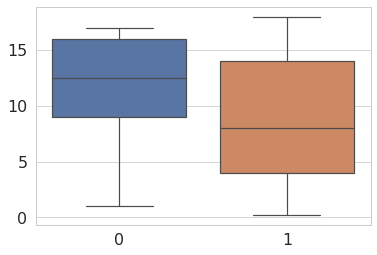

САД


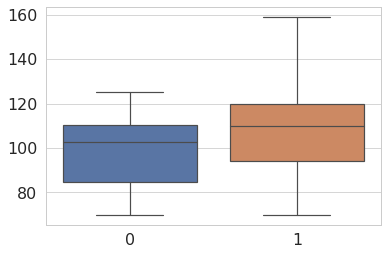

ДАД


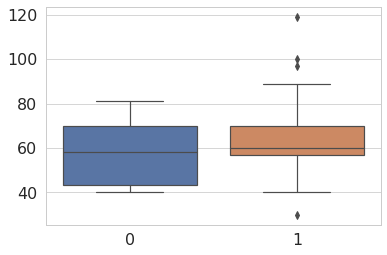

СрАД


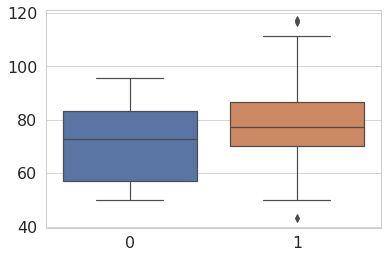

ЧСС


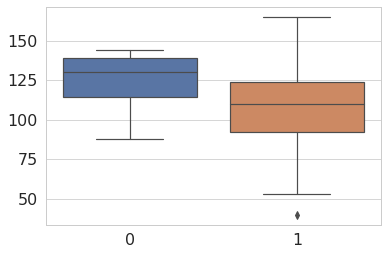

ИА


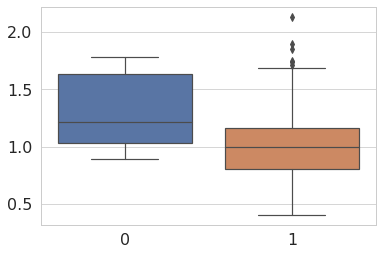

SpO2


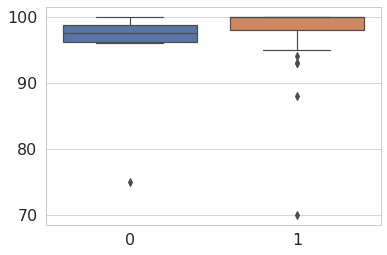

Масса тела


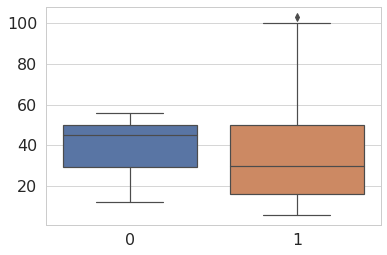

Cl-


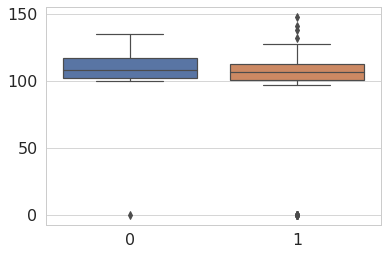

Лактат


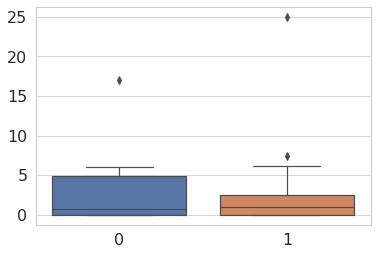

Амилаза


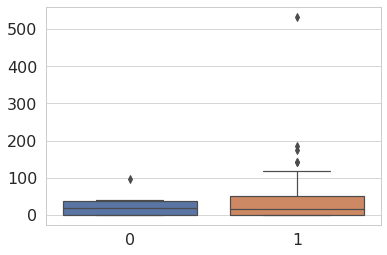

АЛТ


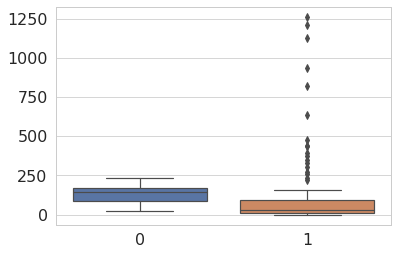

АСТ


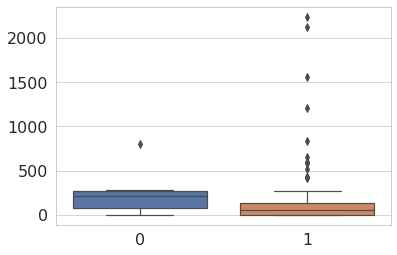

АЧТВ


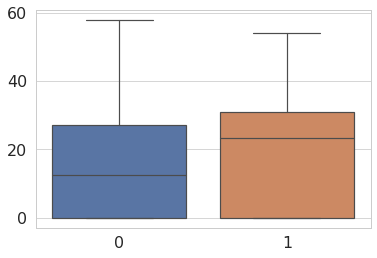

Инфузия, % от N


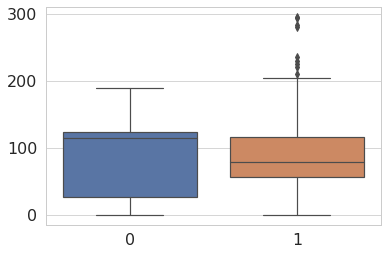

КИ


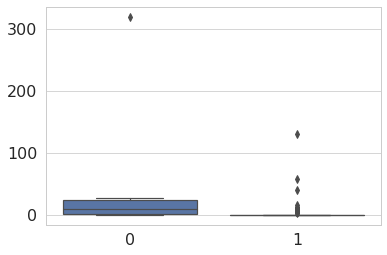

Площадь тела


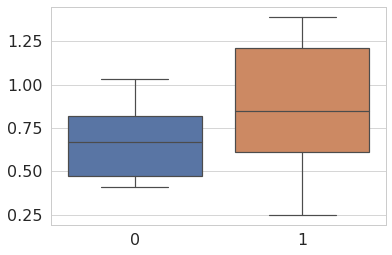

Диурез, мл/кг


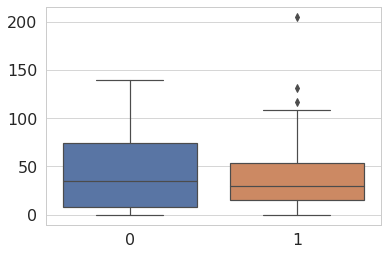

In [116]:
for i in a2.columns[2:-1]:
    if i!='GT':
        print(i)
        sns.boxplot(data = [b2[i],a2[i]]);
        plt.show()

Возраст


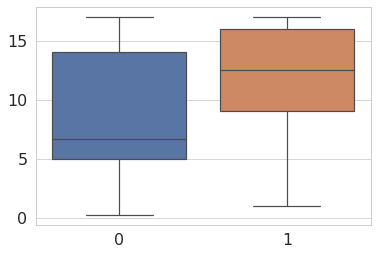

САД


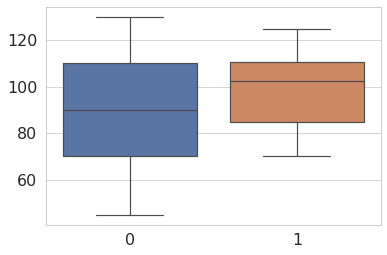

ДАД


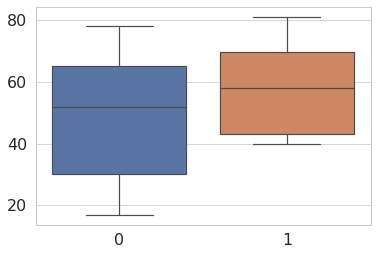

СрАД


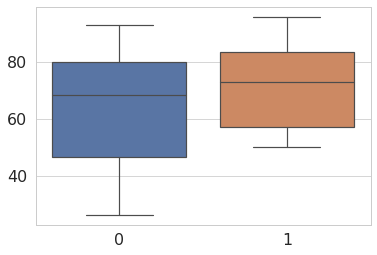

ЧСС


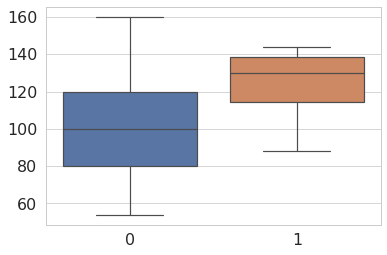

ИА


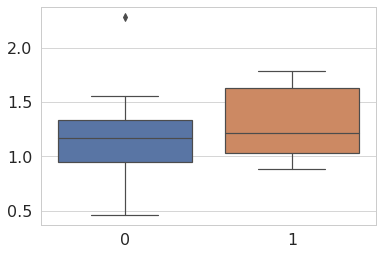

SpO2


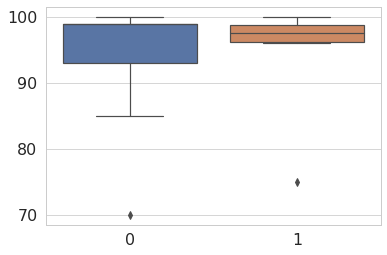

Масса тела


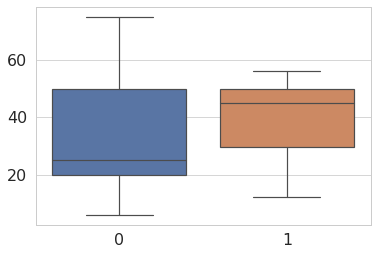

Cl-


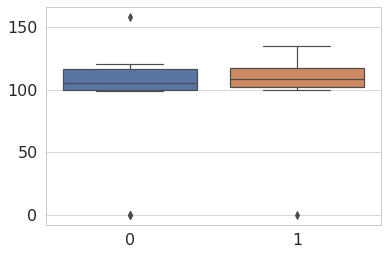

Лактат


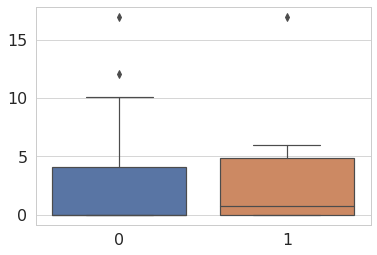

Амилаза


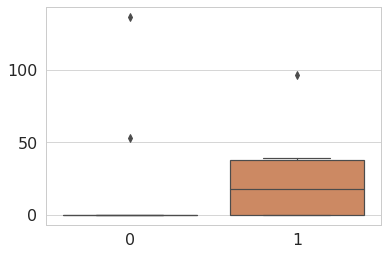

АЛТ


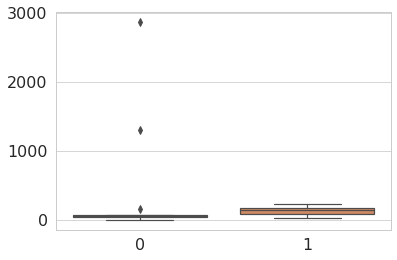

АСТ


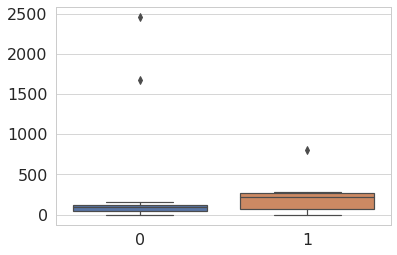

АЧТВ


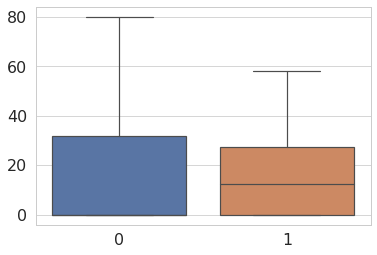

Инфузия, % от N


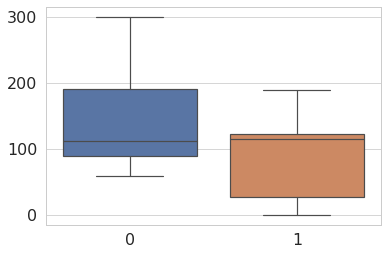

КИ


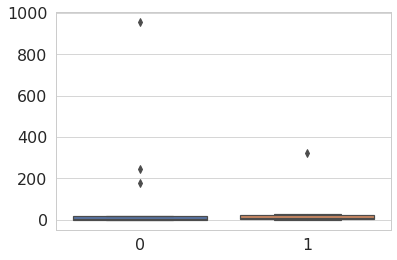

Площадь тела


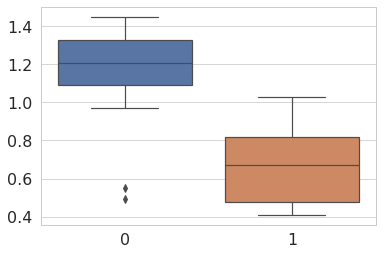

Диурез, мл/кг


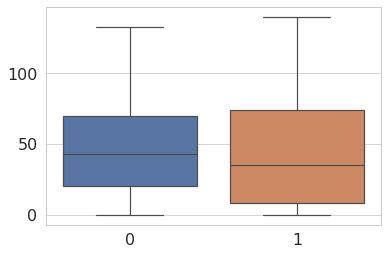

In [117]:
for i in b1.columns[2:-1]:
    if i!='GT':
        print(i)
        sns.boxplot(data = [b1[i],b2[i]]);
        plt.show()

**Результаты проведенного анализа по исходам заболеваний**
* зеленый цвет = разница между группами умерших и выживших пациентов статистически значима;
* светло-голубой = разница между группами по параметру не доказана

In [118]:
df_results = pd.DataFrame(append_list)
df_results.columns = columns
df_results = df_results.pivot(columns = 'Вариант',index = 'Показатель',values = 'p_value').drop('GT',axis=0).style.applymap(highlight_greaterthan)
df_results

Вариант,Все пациенты,"Все пациенты, 1й день",Не получали ГТ,"Не получали ГТ, 1й день",Получали ГТ,"Получали ГТ, 1й день"
Показатель,,,,,,
Cl-,0.000000,0.520005,0.005549,0.668441,0.000011,0.583266
SpO2,0.000000,0.000883,0.000000,0.049058,0.000000,0.007972
АЛТ,0.000000,0.032205,0.010798,0.050053,0.000000,0.173089
АСТ,0.000000,0.121839,0.065848,0.174516,0.000000,0.356569
АЧТВ,0.000103,0.930465,0.002221,0.811024,0.120364,0.631109
Амилаза,0.000000,0.072585,0.000000,0.811612,0.000000,0.054880
Возраст,0.000040,0.757969,0.279320,0.322632,0.000201,0.859691
ДАД,0.000000,0.013720,0.000510,0.488728,0.000458,0.018939
"Диурез, мл/кг",0.759487,0.455305,0.088612,0.919840,0.207432,0.476787
